In [1]:
import os
import numpy as np
import scipy
import scipy.misc as scm
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter

import kwant
import kwant.continuum
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

# 1) Testing final theoretical equations for energies (14, 15a, 15b, 15c) and applying Hermit series to 2D harmonic oscillators

In [2]:
def calculate_eigenenergies_sum_of_omegas(N, n, m, omega_minus, omega_plus, sgn):
    final_res = np.zeros((N,N))
    for i in n:
        for j in m:
            energy = sgn*omega_minus*(i+0.5)+omega_plus*(j+0.5)
            final_res[i,j] = energy
    final_res = final_res.flatten()
    return final_res

In [3]:
def calculate_eigenenergies_one_omega(N, numerator, omega, sgn):
    final_res = []
    for i in numerator:
        energy = sgn*omega*(i+0.5)
        final_res.append(energy)
    return final_res

In [4]:
# parameters to calculate eigenenergies
A = 10
B = 0
C = 30

In [5]:
delta = (C-A)**2-4.*B**2
delta_sqrt = np.sqrt(delta)

In [6]:
omega_square_minus = C + A - delta_sqrt
omega_minus = np.sqrt(omega_square_minus)
omega_square_plus = C + A + delta_sqrt
omega_plus = np.sqrt(omega_square_plus)

In [7]:
N = 5 #number of eigenstates
n = np.arange(0,N,1)
m = np.arange(0,N,1)

## Calculations for sum of omegas

### sum of omegas, sgn  = 1

In [8]:
E_sum = calculate_eigenenergies_sum_of_omegas(N, n, m, omega_minus, omega_plus, sgn=1)

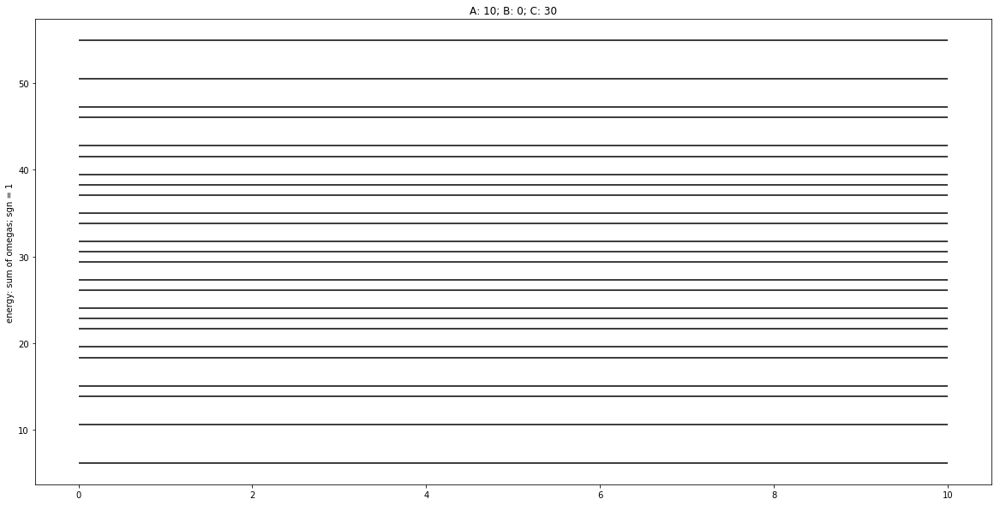

In [9]:
plt.figure(figsize=(20,10))
for i in E_sum:
    plt.hlines(y=i, xmin = 0, xmax = 10)
    plt.title('A: '+str(A)+'; B: '+str(B)+'; C: '+str(C))
    plt.ylabel('energy: sum of omegas; sgn = 1')

### sum of omegas, sgn = -1

In [10]:
E_sum_sgnminus = calculate_eigenenergies_sum_of_omegas(N, n, m, omega_minus, omega_plus, sgn=-1.)

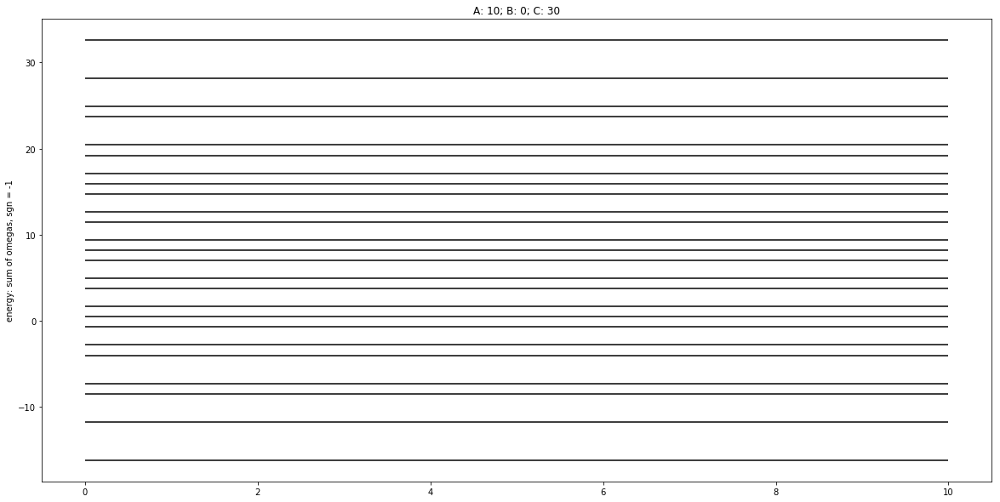

In [11]:
plt.figure(figsize=(20,10))
for i in E_sum_sgnminus:
    plt.hlines(y=i, xmin = 0, xmax = 10)
    plt.title('A: '+str(A)+'; B: '+str(B)+'; C: '+str(C))
    plt.ylabel('energy: sum of omegas, sgn = -1')

###  sum of omegas - all on one plot

Text(0,0.5,'energy: omega sum')

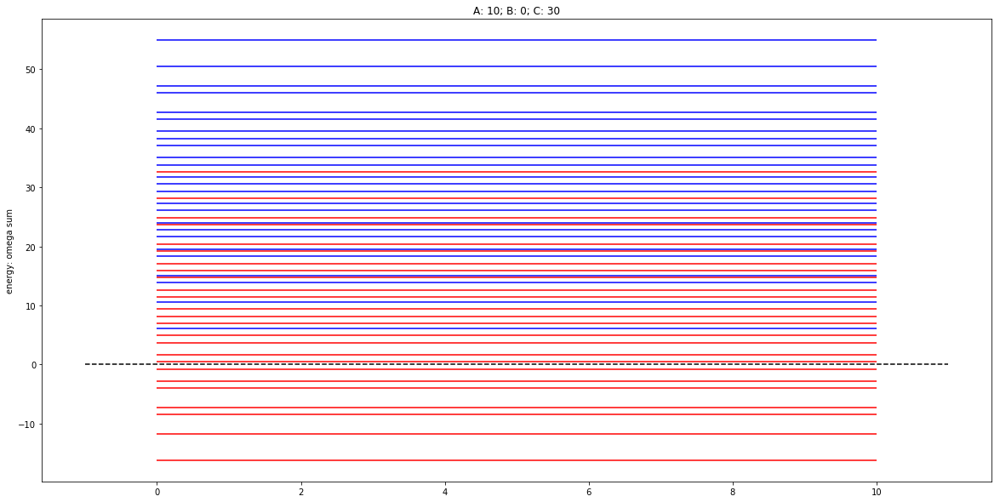

In [12]:
plt.figure(figsize=(20,10))
for i in E_sum_sgnminus:
    plt.hlines(y=i, xmin = 0, xmax = 10, color='r')
    plt.title('A: '+str(A)+'; B: '+str(B)+'; C: '+str(C))
for i in E_sum:
    plt.hlines(y=i, xmin = 0, xmax = 10, color ='b')
    plt.title('A: '+str(A)+'; B: '+str(B)+'; C: '+str(C))

plt.hlines(y=0, xmin = -1, xmax = 11, color ='k', linestyle='--')
plt.ylabel('energy: omega sum')

## Calculations for omega minus

### omega minus, sgn = 1

In [13]:
E_minus = calculate_eigenenergies_one_omega(N=N, numerator=n, omega=omega_minus, sgn=1.)

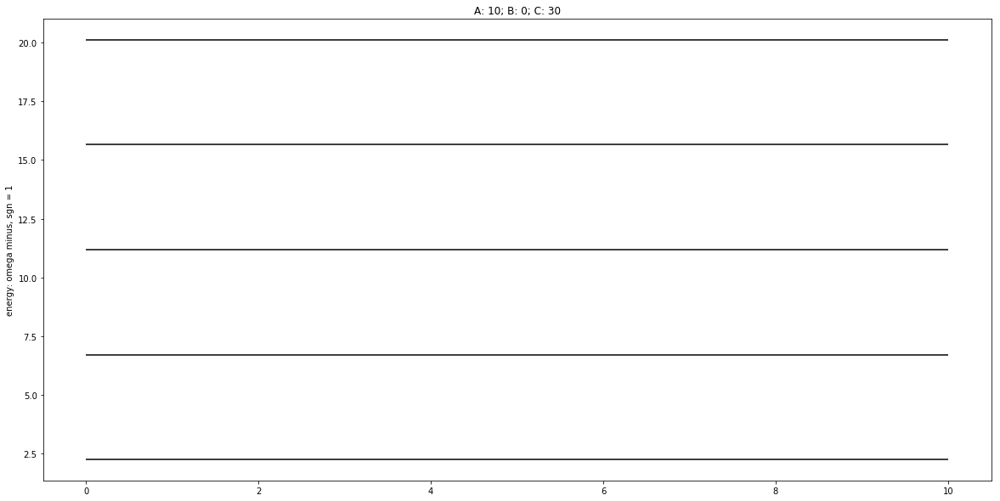

In [14]:
plt.figure(figsize=(20,10))
for i in E_minus:
    plt.hlines(y=i, xmin = 0, xmax = 10)
    plt.title('A: '+str(A)+'; B: '+str(B)+'; C: '+str(C))
    plt.ylabel('energy: omega minus, sgn = 1')

### omega minus, sgn = -1 

In [15]:
E_minus_sgnminus = calculate_eigenenergies_one_omega(N=N, numerator=n, omega=omega_minus, sgn=-1.)

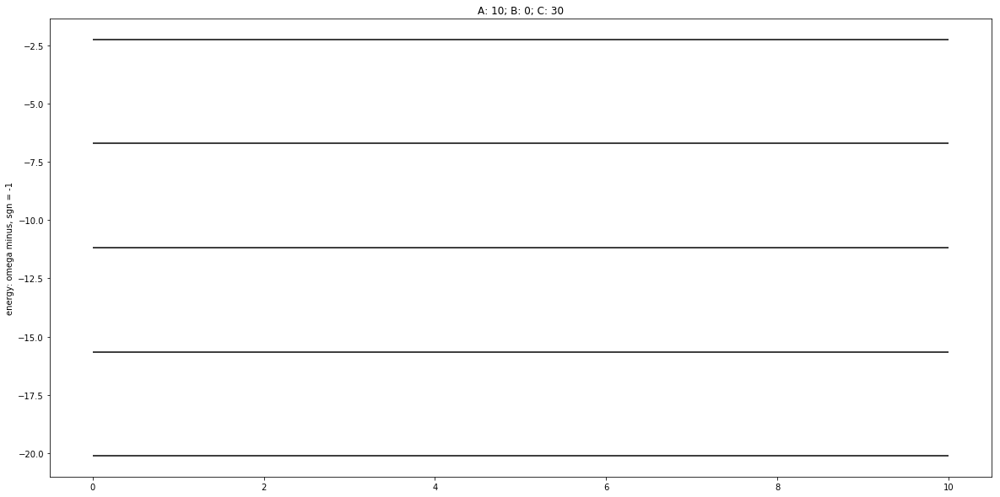

In [16]:
plt.figure(figsize=(20,10))
for i in E_minus_sgnminus:
    plt.hlines(y=i, xmin = 0, xmax = 10)
    plt.title('A: '+str(A)+'; B: '+str(B)+'; C: '+str(C))
    plt.ylabel('energy: omega minus, sgn = -1')

### omega minus - all on one plot

Text(0,0.5,'energy: omega minus')

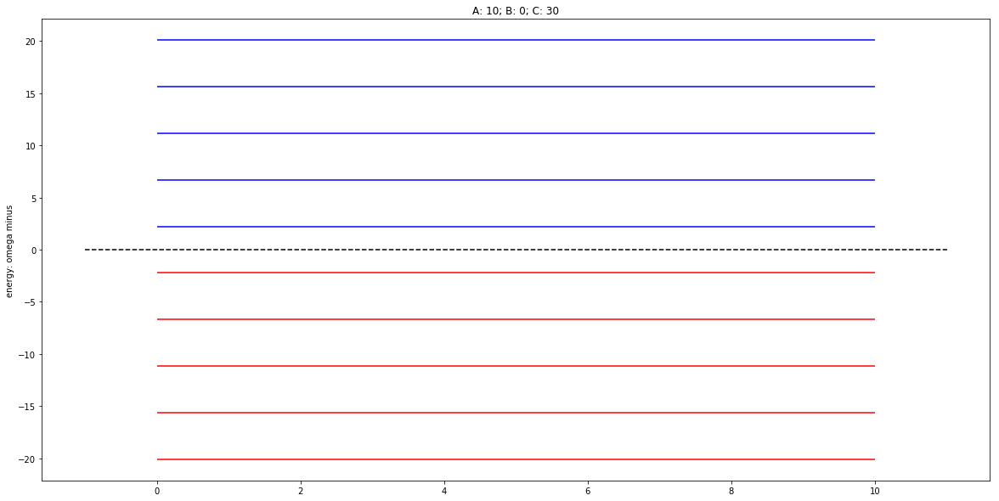

In [17]:
plt.figure(figsize=(20,10))
for i in E_minus_sgnminus:
    plt.hlines(y=i, xmin = 0, xmax = 10, color='r')
    plt.title('A: '+str(A)+'; B: '+str(B)+'; C: '+str(C))
for i in E_minus:
    plt.hlines(y=i, xmin = 0, xmax = 10, color ='b')
    plt.title('A: '+str(A)+'; B: '+str(B)+'; C: '+str(C))

plt.hlines(y=0, xmin = -1, xmax = 11, color ='k', linestyle='--')
plt.ylabel('energy: omega minus')

## Calculations for omega plus

### omega plus, sgn = 1

In [18]:
E_plus = calculate_eigenenergies_one_omega(N=N, numerator=n, omega=omega_plus, sgn=1.)

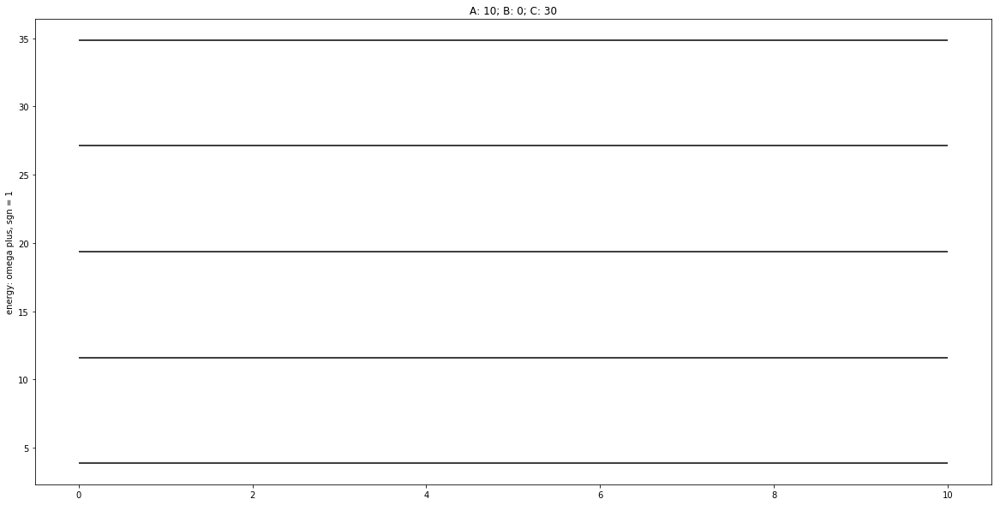

In [19]:
plt.figure(figsize=(20,10))
for i in E_plus:
    plt.hlines(y=i, xmin = 0, xmax = 10)
    plt.title('A: '+str(A)+'; B: '+str(B)+'; C: '+str(C))
    plt.ylabel('energy: omega plus, sgn = 1')

### omega plus, sgn = -1

In [20]:
E_plus_sgnminus = calculate_eigenenergies_one_omega(N=N, numerator=n, omega=omega_plus, sgn=-1.)

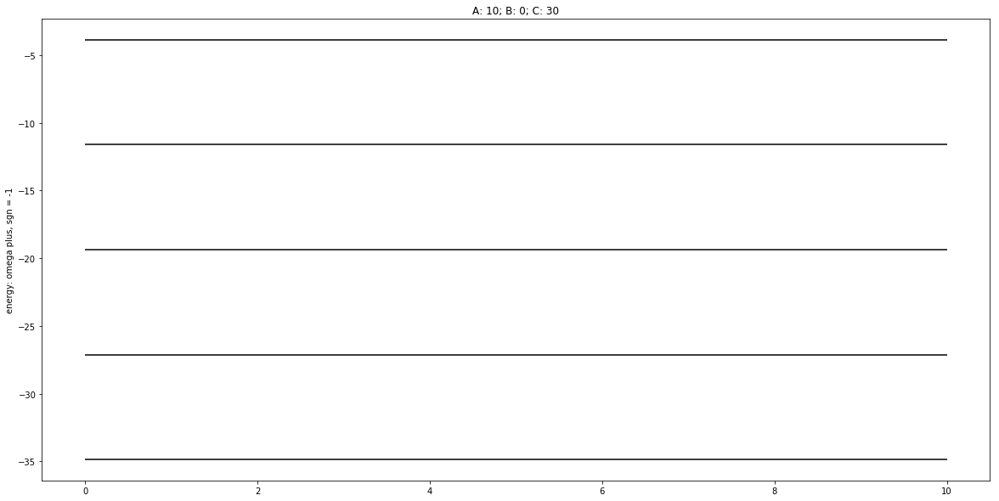

In [21]:
plt.figure(figsize=(20,10))
for i in E_plus_sgnminus:
    plt.hlines(y=i, xmin = 0, xmax = 10)
    plt.title('A: '+str(A)+'; B: '+str(B)+'; C: '+str(C))
    plt.ylabel('energy: omega plus, sgn = -1')

### omega plus - all on one plot

Text(0,0.5,'energy: omega plus')

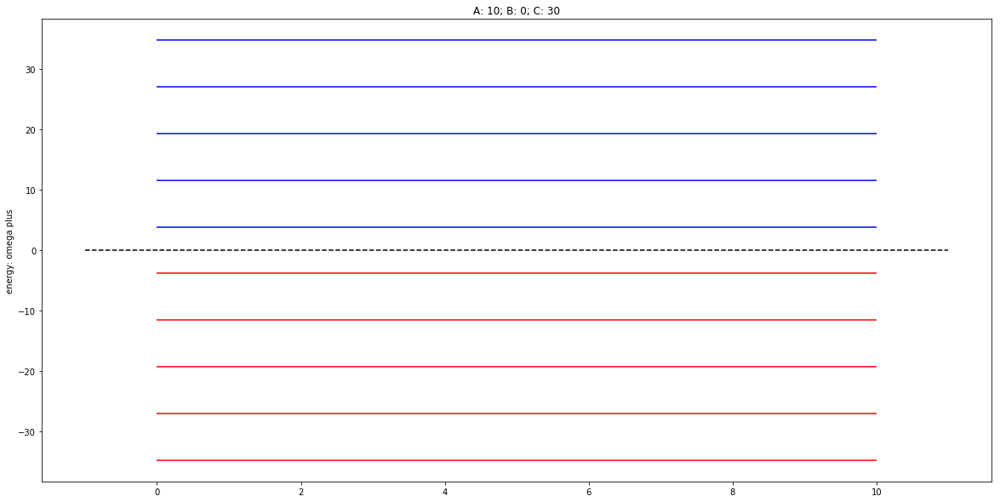

In [22]:
plt.figure(figsize=(20,10))
for i in E_plus_sgnminus:
    plt.hlines(y=i, xmin = 0, xmax = 10, color='r')
    plt.title('A: '+str(A)+'; B: '+str(B)+'; C: '+str(C))
for i in E_plus:
    plt.hlines(y=i, xmin = 0, xmax = 10, color ='b')
    plt.title('A: '+str(A)+'; B: '+str(B)+'; C: '+str(C))

plt.hlines(y=0, xmin = -1, xmax = 11, color ='k', linestyle='--')
plt.ylabel('energy: omega plus')

## Calculating wave function with Hermit series.

In [23]:
def factorial(l):
    res = 1
    for i in l:
        res = res*i
    if len(l)== 1 and l[0] == 0:
        res = 1
    return res

In [24]:
def wave_function(x, n, m=1, omega_small=1, h_bar=1):
    l = np.arange(1, n+1, 1)
    if n == 0:
        l = [0]
    f = factorial(l)
    if n == 0:
        H = 1
        #print('n=0')
    elif n == 1:
        H = 2*x
        #print('n=1')
    elif n == 2:
        H = 4*x*x-2
        #print('n=2')
    elif n == 3:
        H = 8*x*x*x - 12*x
        #print('n=3')
    elif n == 4:
        H = 16*x*x*x*x - 48*x*x +12
        #print('n=4')
    res = (1./np.sqrt((2**n)*f))*(((m*omega_small)/(np.pi*h_bar))**(1./4.))*(np.exp(-1.*(m*omega_small*x*x)/(2*h_bar)))*H
    return res    

In [25]:
x = np.arange(-10,10,0.01)

In [26]:
wf0 = wave_function(x, n=0, m=1, omega_small=1, h_bar=1)
wf1 = wave_function(x, n=1, m=1, omega_small=1, h_bar=1)
wf2 = wave_function(x, n=2, m=1, omega_small=1, h_bar=1)
wf3 = wave_function(x, n=3, m=1, omega_small=1, h_bar=1)
wf4 = wave_function(x, n=4, m=1, omega_small=1, h_bar=1)

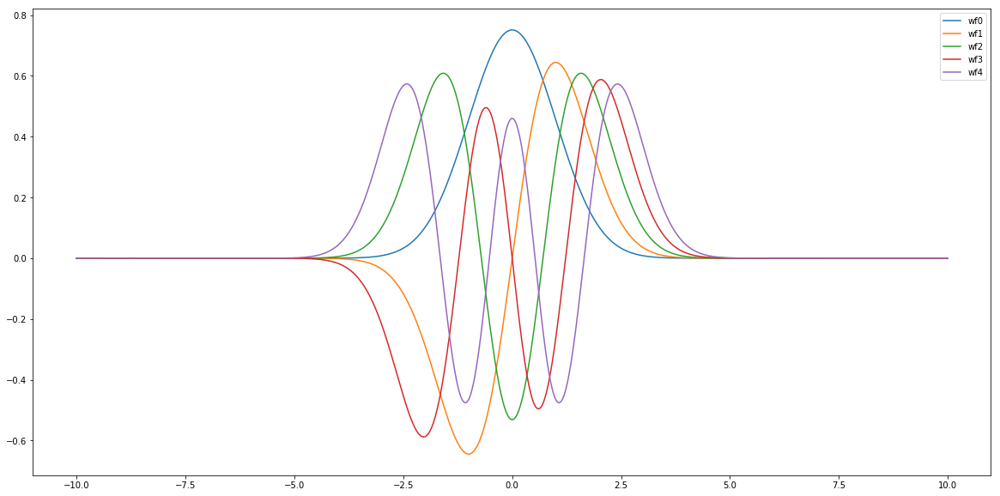

In [27]:
plt.figure(figsize=(20,10))
plt.plot(x,wf0, label='wf0')
plt.plot(x,wf1, label='wf1')
plt.plot(x,wf2, label='wf2')
plt.plot(x,wf3, label='wf3')
plt.plot(x,wf4, label='wf4')
plt.legend()

In [28]:
for j in range(0,5):
    wf = wave_function(x, n=j, m=1, omega_small=1, h_bar=1)
    print(np.sum(np.abs(wf)**2))

100.0
100.0
100.0
100.0
100.0


## Harmonic oscillators 2D

In [29]:
x = np.arange(-10,10,0.01)
y = np.arange(-10,10,0.01)
X, Y = np.meshgrid(x, y)

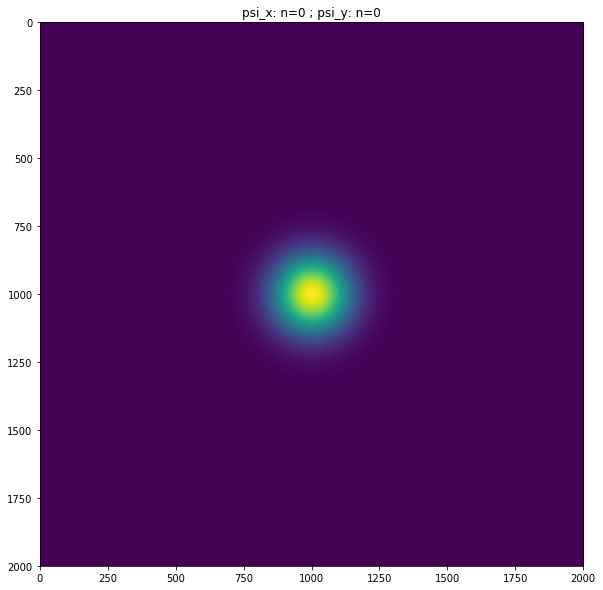

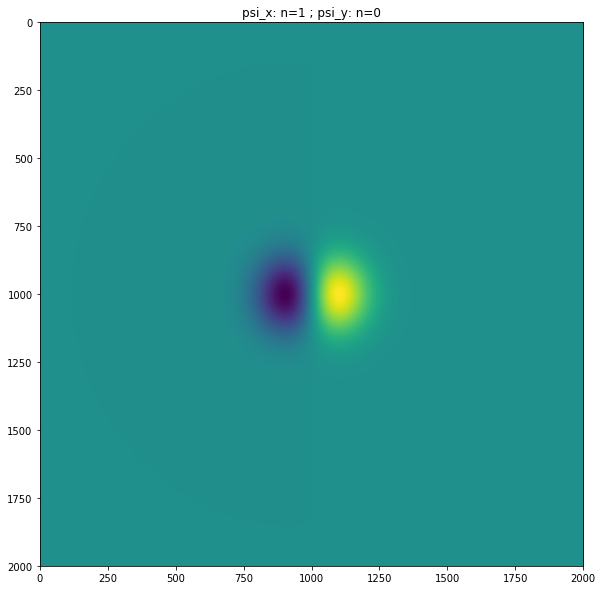

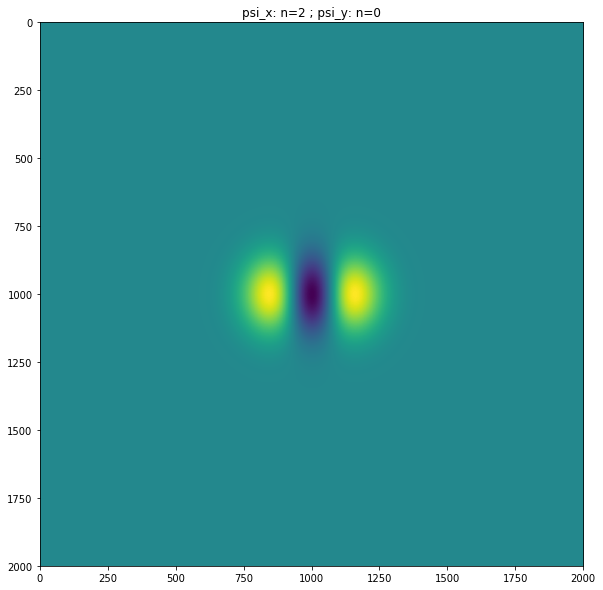

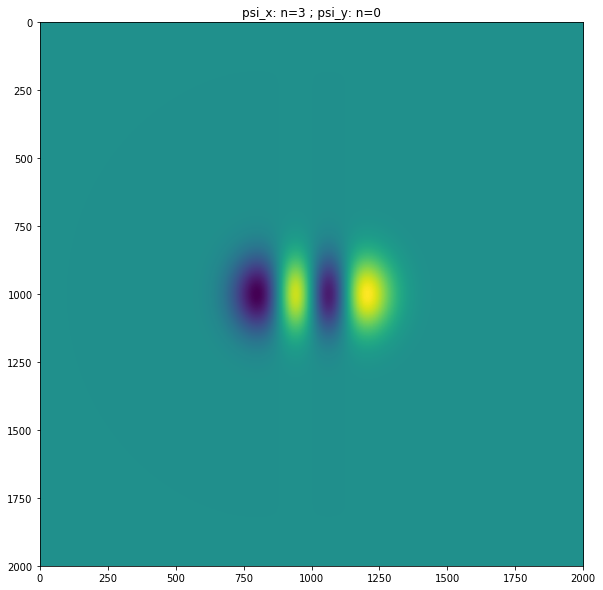

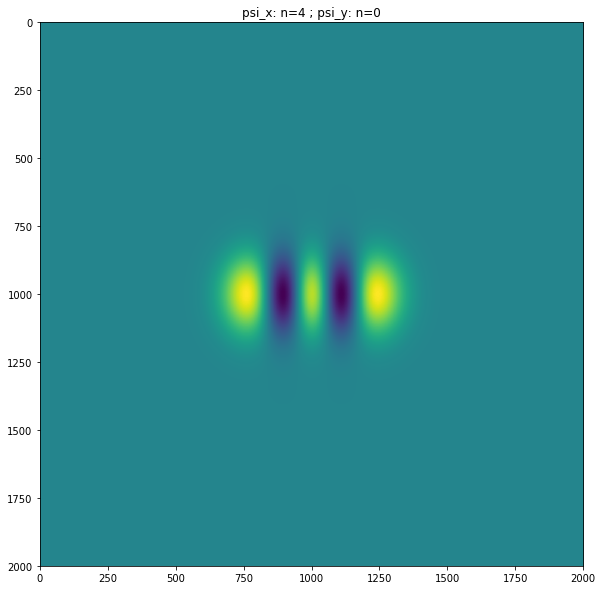

...

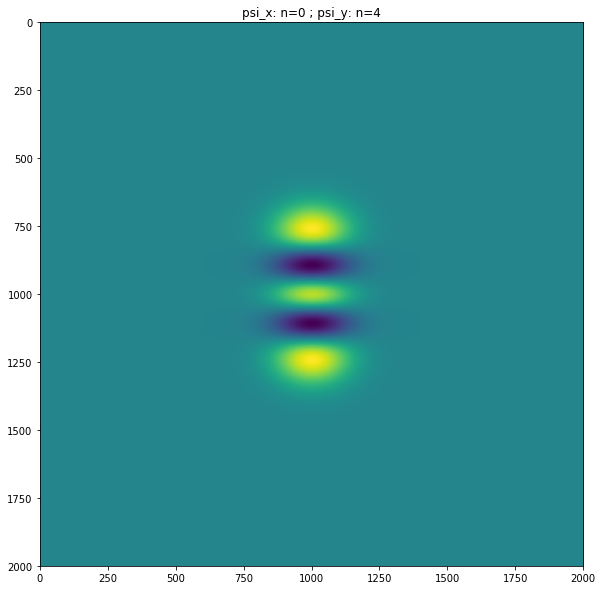

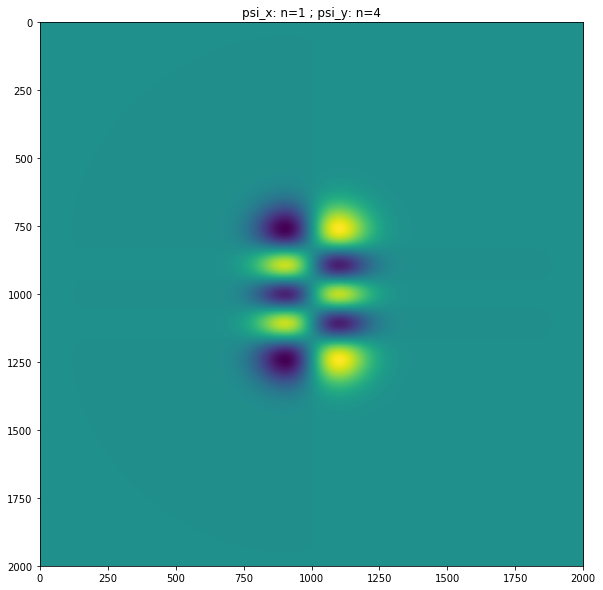

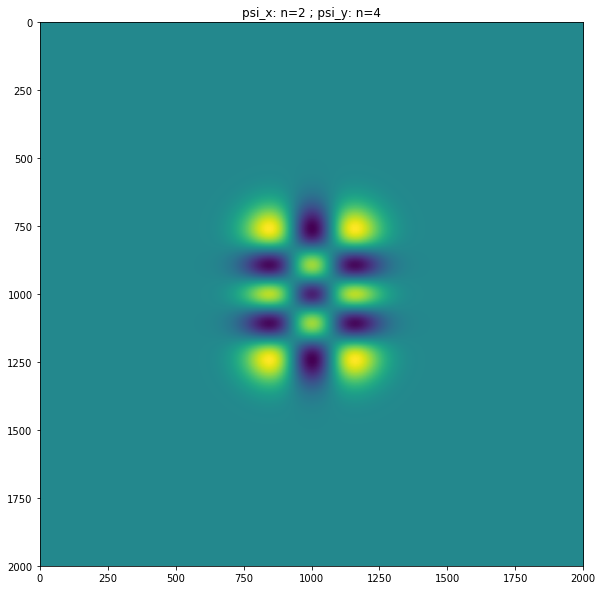

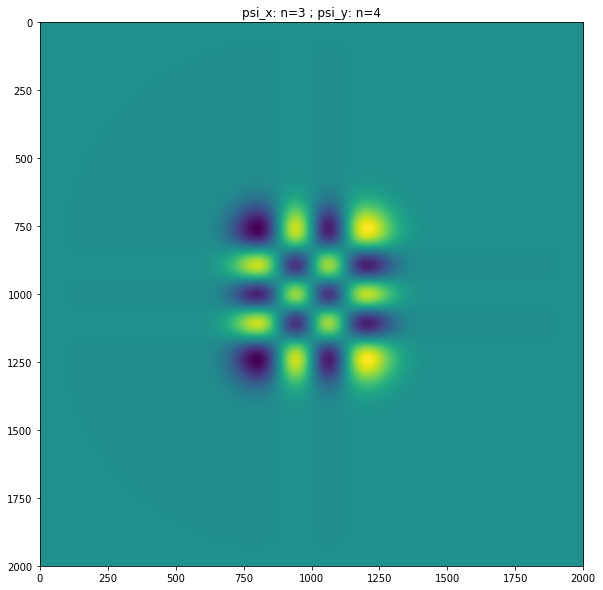

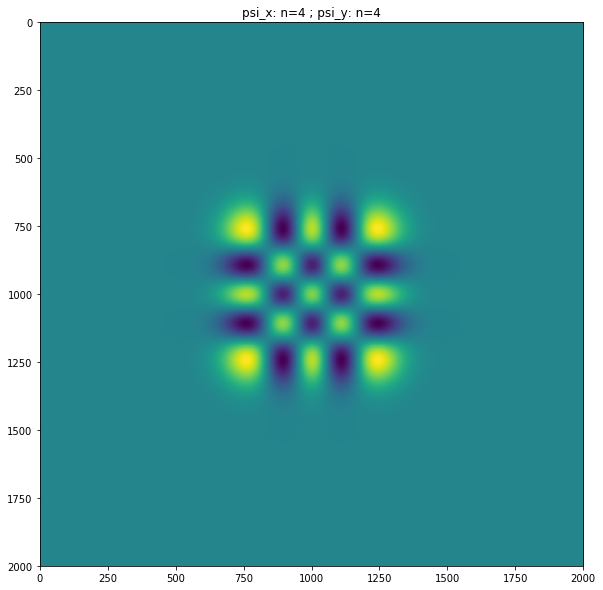

In [30]:
nums = [0,1,2,3,4]
for j in nums:
    for i in nums:
        psi_x = wave_function(X, n=i, m=1, omega_small=1, h_bar=1)
        psi_y = wave_function(Y, n=j, m=1, omega_small=1, h_bar=1)
        Z = psi_x * psi_y
        fig = plt.figure(figsize=(20,10))
        plt.imshow(Z)
        plt.title('psi_x: n='+str(i)+' ; psi_y: n='+str(j))

# 2) Creating and visualising saddle potential

## Preparing and plotting hyperboloids

### Hyperbolic paraboloid

In [31]:
a = 2.
b = 2.
x = np.arange(-10,10,0.1)
y = np.arange(-10,10,0.1)

In [32]:
X, Y = np.meshgrid(x, y)
Z = (X/a)**2-(Y/b)**2

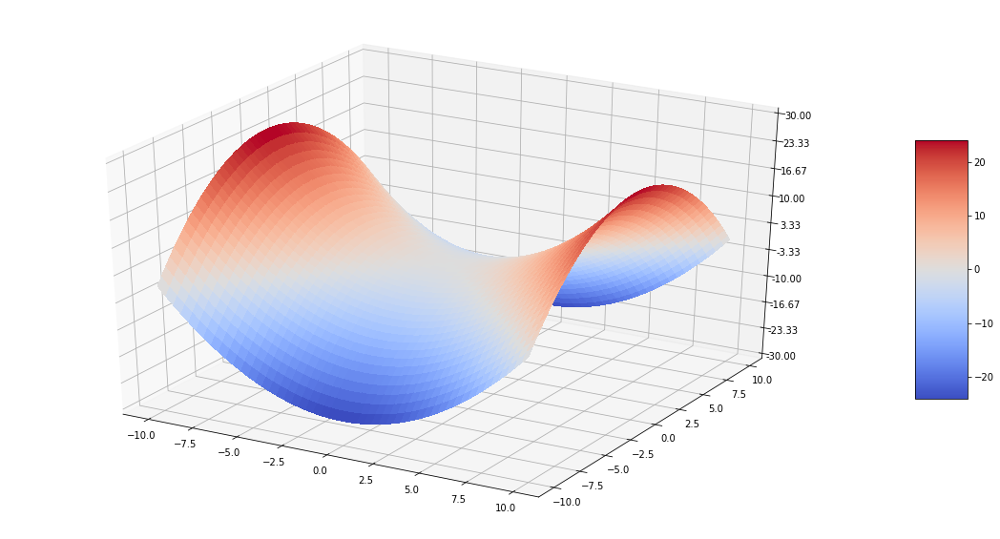

In [33]:
fig = plt.figure(figsize=(20,10))
ax = fig.gca(projection='3d')
surf = ax.plot_surface(X, Y, Z, cmap=cm.coolwarm,linewidth=0, antialiased=False)
ax.set_zlim(-30, 30)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
fig.colorbar(surf, shrink=0.5, aspect=5)

### Elliptic paraboloid

In [34]:
a = 2
b = 2
c = 2
x = np.arange(-10,10,0.1)
y = np.arange(-10,10,0.1)

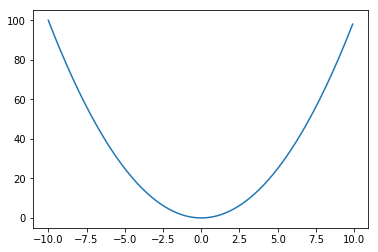

In [35]:
plt.plot(x, x**2)

In [36]:
X, Y = np.meshgrid(x, y)
Z1 = (((X/a)**2+(Y/b)**2)*c)+267
Z2 = -1.*((X/a)**2+(Y/b)**2)*c

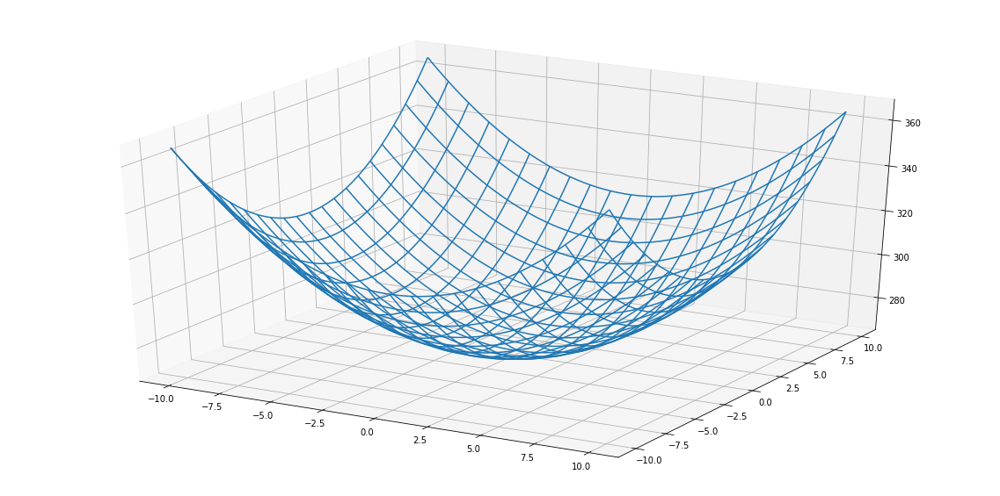

In [37]:
fig = plt.figure(figsize=(20,10))
ax = fig.gca(projection='3d')
surf = ax.plot_wireframe(X, Y, Z1, rstride=10, cstride=10) 

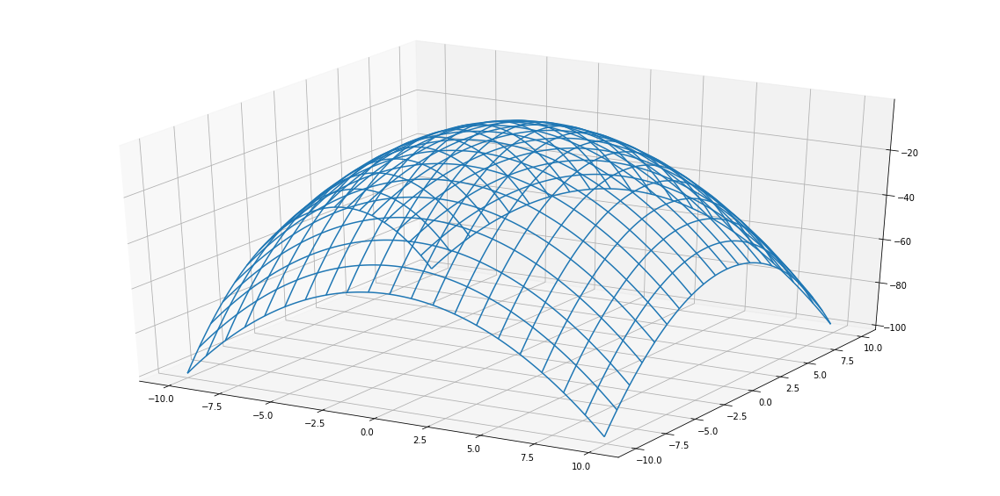

In [38]:
fig = plt.figure(figsize=(20,10))
ax = fig.gca(projection='3d')
surf = ax.plot_wireframe(X, Y, Z2, rstride=10, cstride=10) 

### Defining and testing saddle potential function

In [39]:
def saddle_potential(x, y, Vx=.0003, Vy=.0005):
    return ((Vx*x)/2.)**2 - ((Vy*y)/2.)**2

In [40]:
x = np.arange(-10,10,0.1)
y = np.arange(-10,10,0.1)
X, Y = np.meshgrid(x,y)
Z = saddle_potential(X,Y)

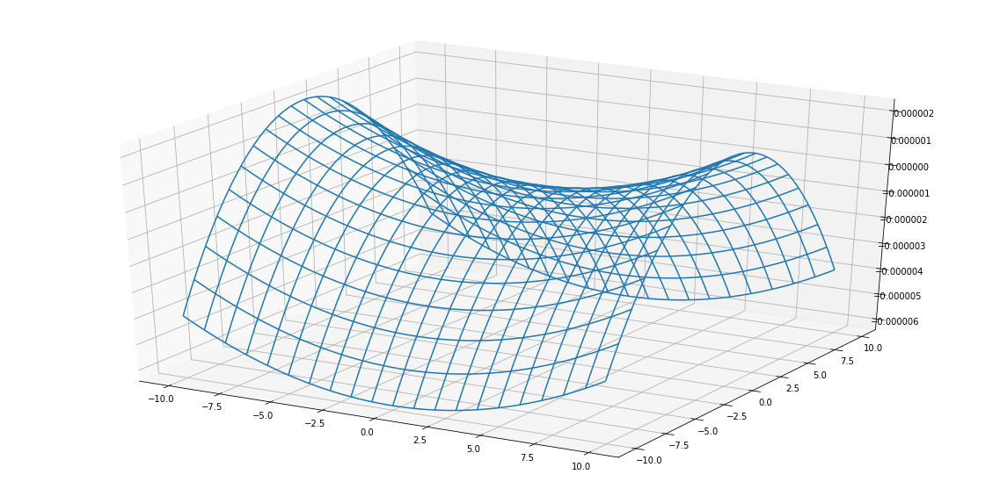

In [41]:
fig = plt.figure(figsize=(20,10))
ax = fig.gca(projection='3d')
surf = ax.plot_wireframe(X, Y, Z, rstride=10, cstride=10) 

# 3) Simulation using Kwant and theoretical modelling 

## Defining functions

In [42]:
def get_theoretical_eigenenergies(A=A, B=B, C=C, N_n=10, N_m=10):
    '''Calculation od eigenenergies based on equation 14 and 15 (a,b,c)'''
    # delta
    delta = ((C-A)**2)-(4.*(B**2))
    delta_sqrt = np.sqrt(delta)
    # calculating omegas
    omega_square_minus = C + A - delta_sqrt
    omega_minus = np.sqrt(omega_square_minus)
    omega_square_plus = C + A + delta_sqrt
    omega_plus = np.sqrt(omega_square_plus)
    # creating eigenstates
    n = np.arange(0,N_n,1)
    m = np.arange(0,N_m,1)
    # calculating eigenenergies
    E_n_m = np.zeros((N_n,N_m))
    Enmlist=[]
    for i_n in n:
        for i_m in m:
            energy = (-1.*omega_minus*(i_n+0.5))+(omega_plus*(i_m+0.5))
            E_n_m[i_n,i_m] = energy
            Enmlist.append((energy, (i_n, i_m)))
    E_n_m = E_n_m.flatten()
    return Enmlist

In [43]:
def plot_potential(X, Y, Z, z_lim_start=-1.3, z_lim_end=0.33):
    #plotting potential
    fig = plt.figure(figsize=(20,10))
    ax = fig.gca(projection='3d')
    surf = ax.plot_surface(X, Y, Z, cmap=cm.coolwarm,linewidth=0, antialiased=False)
    ax.set_zlim(z_lim_start, z_lim_end)
    ax.zaxis.set_major_locator(LinearLocator(10))
    ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
    fig.colorbar(surf, shrink=0.5, aspect=5)

In [44]:
def stadium(site):
    (x, y) = site.pos
    return x**2 + y**2 < R**2

In [45]:
def discretize_hamiltonian(a=20/50, ham="k_x**2 + k_y**2 + V(x, y)"):
    template = kwant.continuum.discretize(hamiltonian=ham, grid=a)
    print(template)
    return template

In [46]:
def create_system(template, stadium, site=(0,0)):    
    syst = kwant.Builder()
    syst.fill(template, stadium, site);
    syst = syst.finalized()
    return syst

In [47]:
def calculate_eigenvecs_eigenvals_e0(syst, potential, k_num):   
    ham_0 = syst.hamiltonian_submatrix(params=dict(V=potential), sparse=True)
    ham = ham_0.tocsc()
    eigenvalues, eigenvectors = scipy.sparse.linalg.eigsh(A=ham, k=k_num, which='LM', sigma=0.0, tol=10**(-10))
    print(len(eigenvectors))
    print(eigenvectors.shape)        
    return eigenvalues, eigenvectors

In [48]:
def plot_energy_eigenstates(eigenvectors, target_path='./', save=False):
    if save==False:
        for i in range(eigenvectors.shape[1]):
            print('energy eigenstate:',i)
            kwant.plotter.map(syst, abs(eigenvectors[:, i])**2, show=True)
    elif save == True:
        filename = 'energy_eigenstate'
        for i in range(eigenvectors.shape[1]):
            kwant.plotter.map(syst, abs(eigenvectors[:, i])**2, show=True, file=target_path+filename+str(i))

In [49]:
def get_candidates_idx(syst, tresh=0.2, dist=3., overlap_def=0.):
    # from KWANT construct arrays of x and y site coordinates
    arrx_by_id = np.array( [site[1][0] for site in syst.sites ] )
    arry_by_id = np.array( [site[1][1] for site in syst.sites ] )

    nsites = len(arrx_by_id)
    indexx= len(eigenvectors[1])
    tresh = tresh
    res_idx=[]

    for index in range(indexx):
        evecs = eigenvectors

        def give_overlap(index):
            vect = evecs[:,index]

            overlap = overlap_def
            for i in range(nsites):
                ix = arrx_by_id[i]
                iy = arry_by_id[i]

                if (ix**2+iy**2)*a**2 < dist**2:
                    overlap += np.abs(vect[i])**2
            return overlap
        if give_overlap(index)>=tresh:
            res_idx.append(index)
        else:
            continue
    print(res_idx)
    return res_idx

In [50]:
def plot_eigenvalues(eigenvalues):
    plt.plot(eigenvalues[:], 'ko')

In [51]:
def get_candidates_vals(res_idx, eigenvalues, eigenvectors):
    #plotting candidates 
    vals = []
    for i in res_idx:
        j = eigenvalues[i] 
        print('energy eigenstate:',i)
        print('eigenvalue:', j)
        kwant.plotter.map(syst, abs(eigenvectors[:, i])**2, show=True)
        vals.append((j,i))
        svals = sorted(vals)
    return svals

In [52]:
def plot_final_results(svals, Enmlist, eigenvalues):
    # plotting both 
    vals = svals
    plt.figure(figsize=(20,10))
    MAX = vals[len(vals)-1][0]+0.001
    MIN = vals[0][0]-0.001

    for k in Enmlist:
        i=k[0]
        if i >= MIN:
            if i <= MAX:
                plt.hlines(y=i, xmin = 0, xmax = 7, color='b')
                plt.text(-0.4,i,str(k[1]), ha='left', va='center', color='b')
                plt.title('A: '+str(A)+'; B: '+str(B)+'; C: '+str(C))
                plt.ylabel('energy: sum of omegas;')

    for i in eigenvalues:
        if i >= MIN:
            if i <= MAX:
                plt.hlines(y=i, xmin = 5, xmax = 10, color='r', linestyle='--')
                plt.title('A: '+str(A)+'; B: '+str(B)+'; C: '+str(C))


    for k in range(len(vals)):
        plt.hlines(y=vals[k][0], xmin = 1, xmax = 8, color ='k', linestyle='--') 
        plt.text(0.5,vals[k][0],str(vals[k][1]), ha='left', va='center', color='k')
        plt.text(11.2,vals[k][0],str(vals[k][0]), ha='right', va='center', color='k')

    #plt.ylim((MIN-0.01, MAX+0.01))
    plt.xlim((-0.5,12))
    #plt.ylim((-0.06, -0.058))

In [53]:
base_hamiltonian = "(1/2)*(-k_x**2 + k_y**2) + V(x, y)"

## Comparison of theoretical modeling and numerical calculations using Kwant for first set of parameters

In [54]:
## first set parameters to calculate eigenenergies
A = 0.000364
B = 0. 
C = 3.*A 

#
x_pot = np.arange(-30,30,0.01)
y_pot = np.arange(-30,30,0.01)

#
R = 20
a = R / 50  

# theoretical 1 parameters
N_n = 10 # number of n eigenstates
N_m = 10 # number of m eigenstates

#
k=600

In [55]:
def saddle_potential(x, y, A_pot=A, B_pot=B, C_pot=C):
     return (1./2.)*(-1.*A_pot*x*x + B_pot*y*x + C_pot*y*y) 

In [56]:
def get_potential(x=x_pot, y=y_pot, func=saddle_potential):
    # creating potential
    X, Y = np.meshgrid(x, y)
    Z = saddle_potential(X, Y, A, B, C)
    return (X,Y,Z)

In [57]:
pot_syst = get_potential()

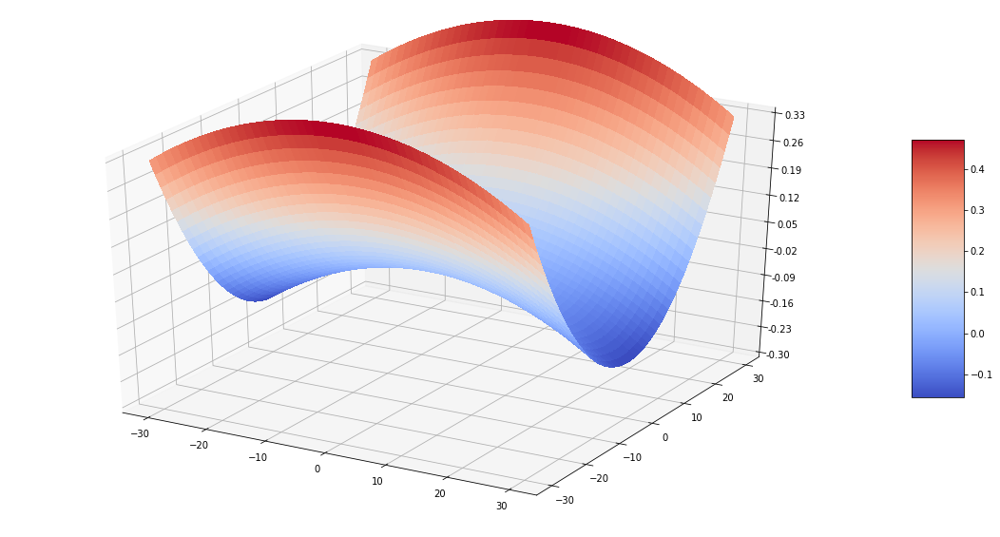

In [58]:
plot_potential(X=pot_syst[0], Y=pot_syst[1], Z=pot_syst[2], z_lim_start=-0.3, z_lim_end=0.33)

In [59]:
discretized_ham = discretize_hamiltonian(a=a, ham=base_hamiltonian)

# Discrete coordinates: x y

# Onsite element:
def onsite(site, V):
    (x, y, ) = site.pos
    _const_0 = (V(x, y))
    return (_const_0)

# Hopping from (1, 0):
(3.125+0j)

# Hopping from (0, 1):
(-3.125+0j)


In [60]:
syst = create_system(template=discretized_ham, stadium=stadium)

In [61]:
eigenvalues, eigenvectors = calculate_eigenvecs_eigenvals_e0(syst=syst, potential=saddle_potential, k_num=k) 

7825
(7825, 600)


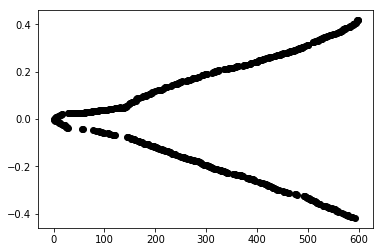

In [62]:
plot_eigenvalues(eigenvalues)

In [63]:
Enmlist = get_theoretical_eigenenergies(A=A, B=B, C=C, N_n=N_n, N_m=N_m)

[4, 9, 12, 13, 14, 15, 16, 25, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 69, 70, 76, 77, 84, 98, 99, 102, 154, 155, 158, 160, 163, 173, 176, 177, 178, 179, 186, 188, 189, 193, 199, 216, 225, 231, 236, 239, 240, 245, 248, 249, 250, 251, 252, 254, 256, 257, 259, 262, 263, 272, 276, 277, 282, 284, 287, 289, 294, 297, 300, 301, 303, 304, 305, 306, 314, 320, 330, 331, 332, 333, 335, 347, 349, 351, 353, 354, 355, 356, 357, 359, 360, 364, 365, 366, 367, 368, 370, 371, 374, 375, 377, 378, 381, 382, 383, 384, 389, 401, 402, 405, 406, 407, 410, 414, 416, 421, 425, 429, 432, 434, 436, 437, 441, 442, 443, 455, 457, 460, 461, 464, 467, 469, 470, 471, 472, 473, 474, 476, 478, 481, 482, 483, 487, 491, 496, 501, 509, 525, 528, 532, 535, 536, 537, 538, 540, 549, 550, 551, 555, 559, 560, 566, 572, 579, 584, 590]
energy eigenstate: 4
eigenvalue: 0.00694675500823


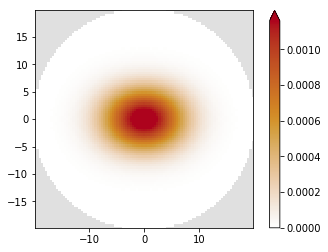

energy eigenstate: 9
eigenvalue: -0.0125312631849


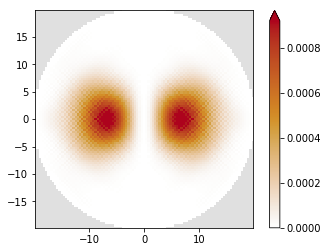

energy eigenstate: 12
eigenvalue: -0.017745036958


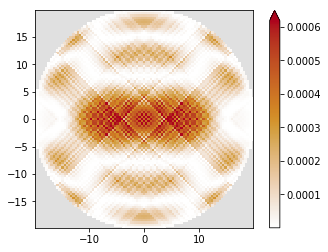

energy eigenstate: 13
eigenvalue: 0.0179465098697


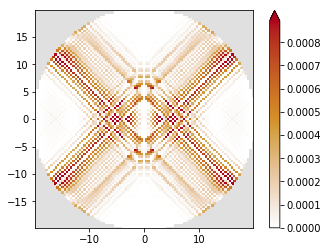

energy eigenstate: 14
eigenvalue: -0.0199682976387


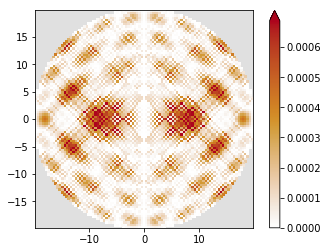

energy eigenstate: 15
eigenvalue: 0.0194566038267


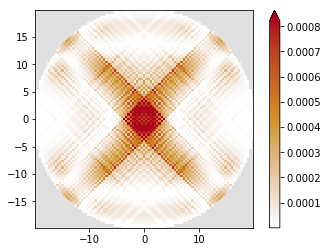

energy eigenstate: 16
eigenvalue: 0.0202730553219


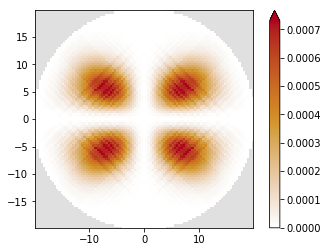

energy eigenstate: 25
eigenvalue: -0.0335395897611


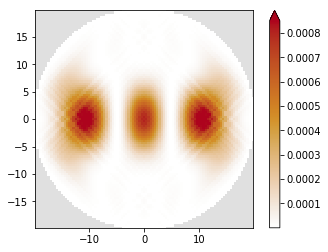

energy eigenstate: 29
eigenvalue: 0.0243107295112


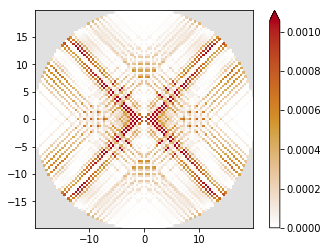

energy eigenstate: 30
eigenvalue: 0.0243030708312


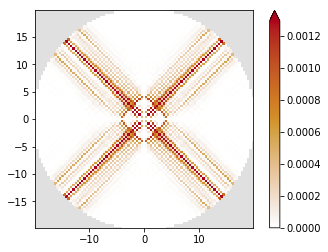

energy eigenstate: 31
eigenvalue: 0.0244706639019


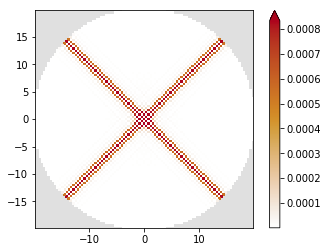

energy eigenstate: 32
eigenvalue: 0.0244851627431


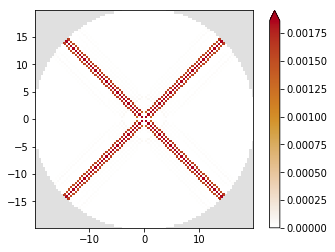

energy eigenstate: 33
eigenvalue: 0.0245111424824


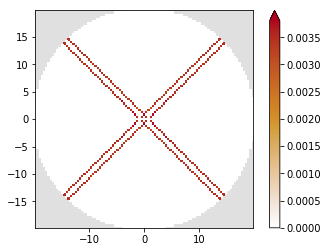

energy eigenstate: 34
eigenvalue: 0.0245542194509


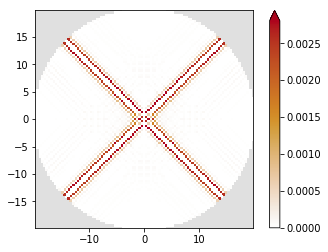

energy eigenstate: 35
eigenvalue: 0.0245766674715


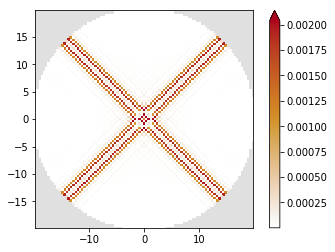

energy eigenstate: 36
eigenvalue: 0.024660779859


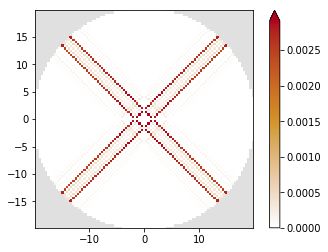

energy eigenstate: 37
eigenvalue: 0.0246972064379


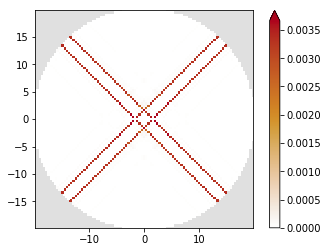

energy eigenstate: 38
eigenvalue: 0.0247966567162


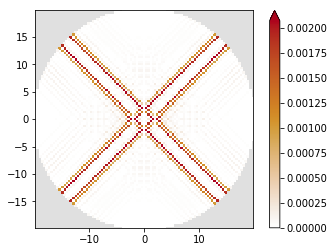

energy eigenstate: 39
eigenvalue: 0.0248105523649


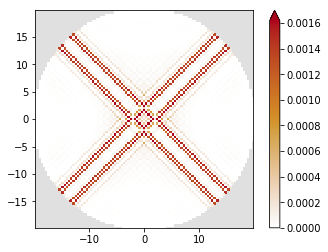

energy eigenstate: 40
eigenvalue: 0.024971117917


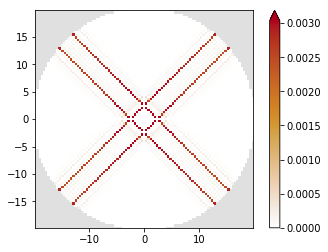

energy eigenstate: 41
eigenvalue: 0.0250382807731


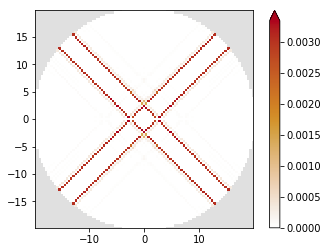

energy eigenstate: 42
eigenvalue: 0.0251315907434


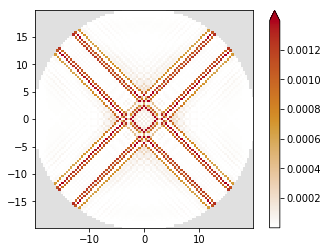

energy eigenstate: 43
eigenvalue: 0.0251666927724


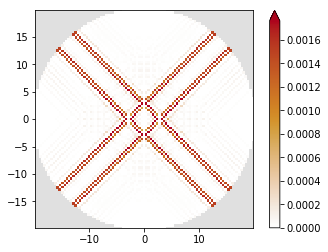

energy eigenstate: 44
eigenvalue: 0.0254196104413


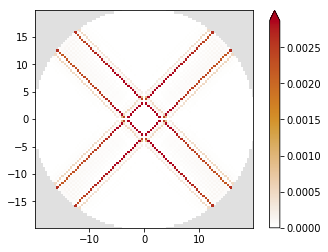

energy eigenstate: 45
eigenvalue: 0.0254838288477


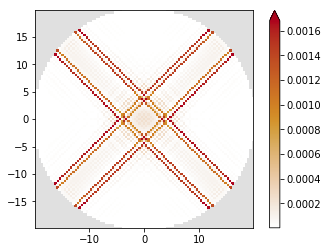

energy eigenstate: 46
eigenvalue: 0.0255634679497


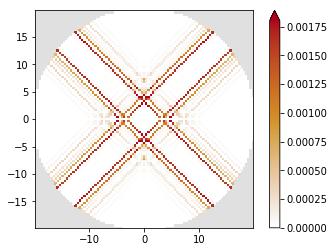

energy eigenstate: 47
eigenvalue: 0.0260200450763


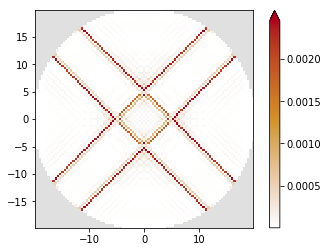

energy eigenstate: 48
eigenvalue: 0.0258163984042


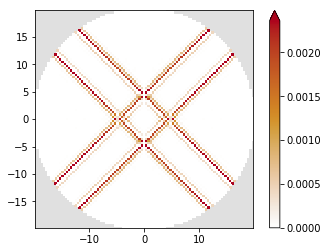

energy eigenstate: 49
eigenvalue: 0.0258345116579


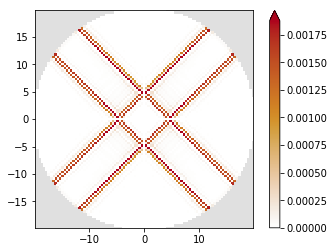

energy eigenstate: 50
eigenvalue: 0.0258280383776


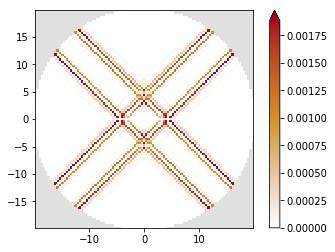

energy eigenstate: 51
eigenvalue: 0.0263754682727


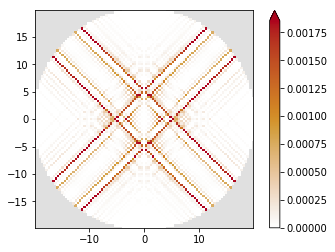

energy eigenstate: 52
eigenvalue: 0.0265436186298


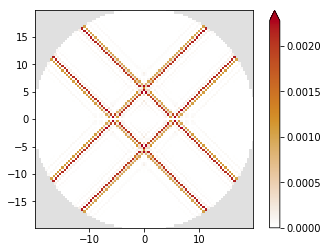

energy eigenstate: 53
eigenvalue: 0.0266643929769


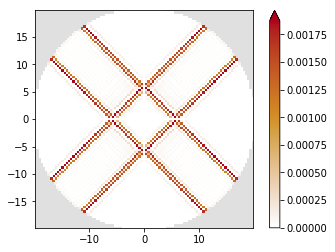

energy eigenstate: 54
eigenvalue: 0.0268025561766


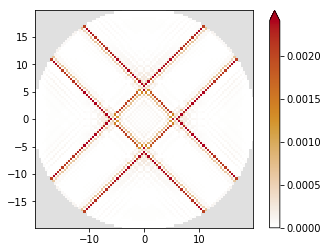

energy eigenstate: 55
eigenvalue: 0.0269456624805


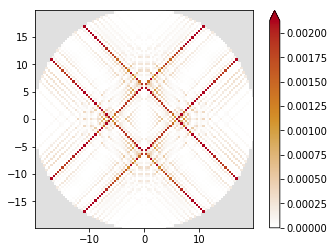

energy eigenstate: 58
eigenvalue: 0.027622974519


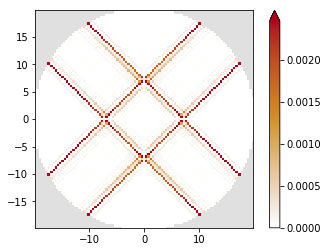

energy eigenstate: 59
eigenvalue: 0.0277273030398


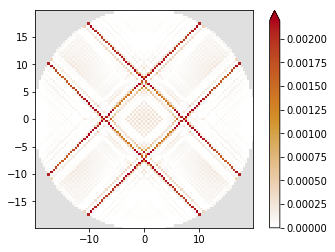

energy eigenstate: 60
eigenvalue: 0.0277478683812


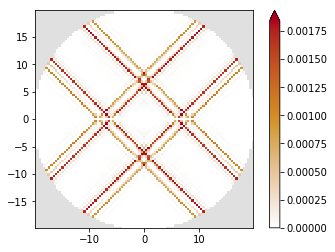

energy eigenstate: 61
eigenvalue: 0.0279581982077


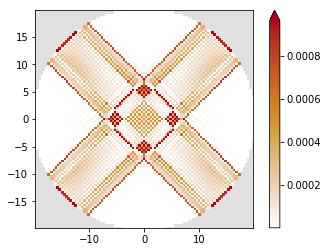

energy eigenstate: 62
eigenvalue: 0.0281814415526


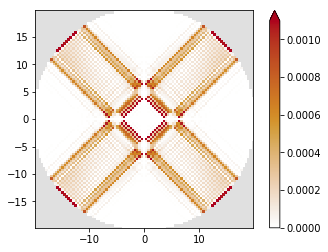

energy eigenstate: 63
eigenvalue: 0.0283271697745


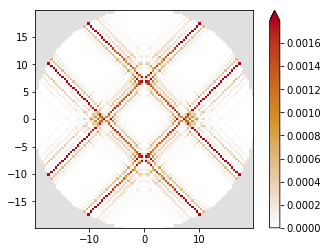

energy eigenstate: 64
eigenvalue: 0.0286877395335


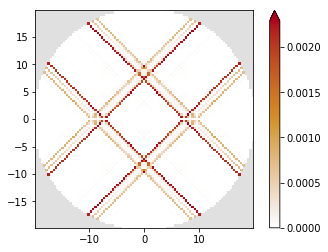

energy eigenstate: 65
eigenvalue: 0.0287623930512


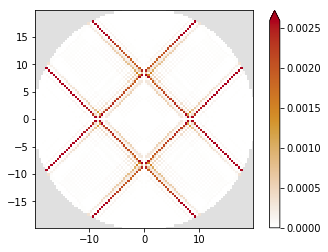

energy eigenstate: 66
eigenvalue: 0.0288289227744


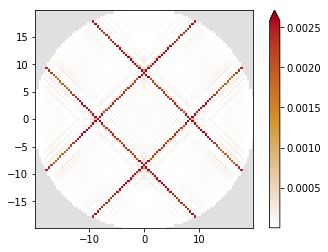

energy eigenstate: 67
eigenvalue: 0.0294007970593


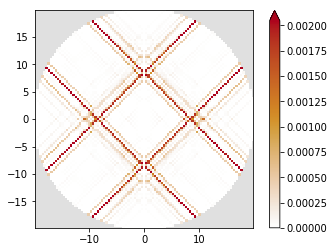

energy eigenstate: 69
eigenvalue: 0.030173299683


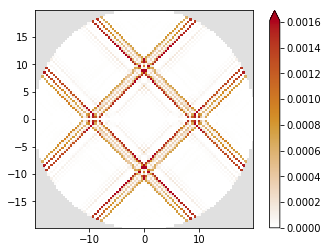

energy eigenstate: 70
eigenvalue: 0.0301676985491


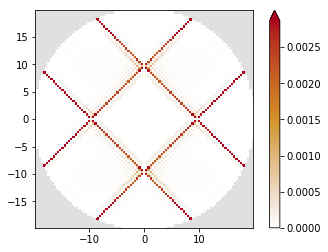

energy eigenstate: 76
eigenvalue: 0.0323391198695


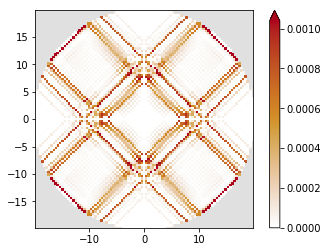

energy eigenstate: 77
eigenvalue: -0.0474965441156


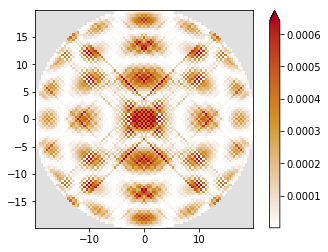

energy eigenstate: 84
eigenvalue: -0.0498978381032


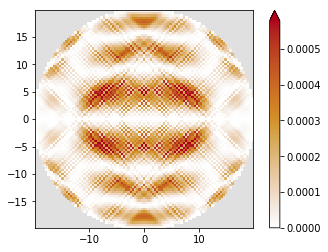

energy eigenstate: 98
eigenvalue: -0.0566829037423


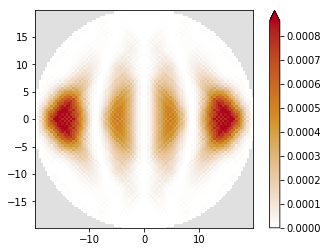

energy eigenstate: 99
eigenvalue: -0.0571069846046


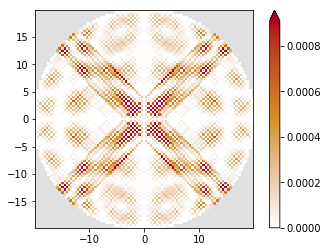

energy eigenstate: 102
eigenvalue: 0.0399210970186


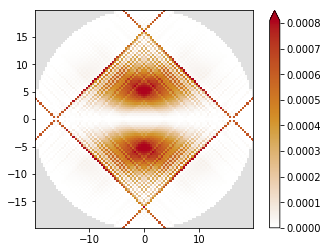

energy eigenstate: 154
eigenvalue: 0.0726158177984


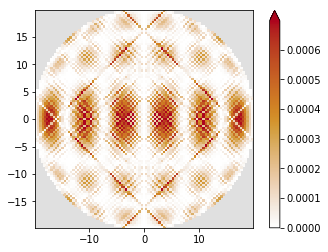

energy eigenstate: 155
eigenvalue: 0.0730498341699


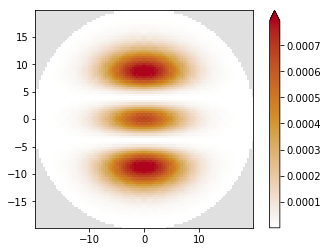

energy eigenstate: 158
eigenvalue: -0.0856307642425


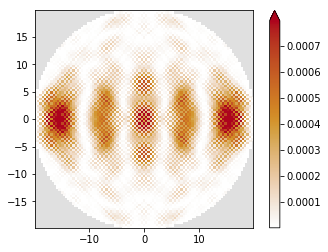

energy eigenstate: 160
eigenvalue: -0.0865911251591


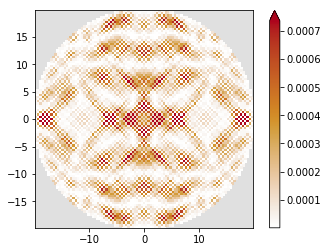

energy eigenstate: 163
eigenvalue: 0.085338035046


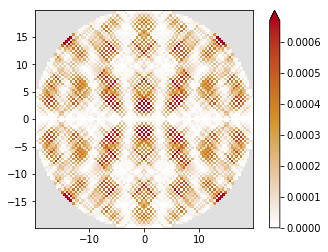

energy eigenstate: 173
eigenvalue: -0.0973626535836


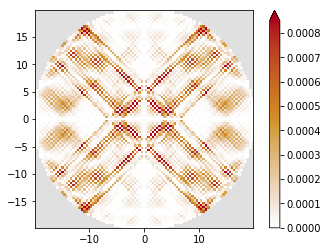

energy eigenstate: 176
eigenvalue: -0.102097881654


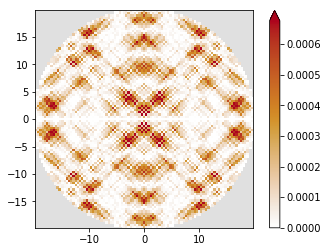

energy eigenstate: 177
eigenvalue: 0.0979506563931


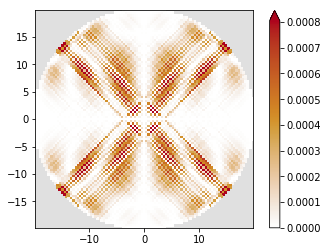

energy eigenstate: 178
eigenvalue: -0.103091667279


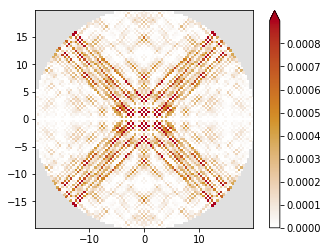

energy eigenstate: 179
eigenvalue: -0.10334501311


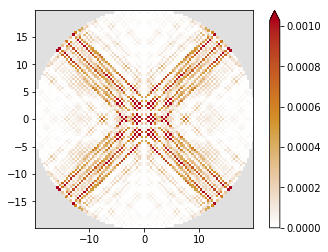

energy eigenstate: 186
eigenvalue: -0.10676290894


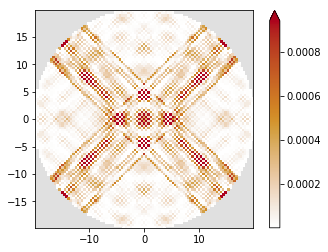

energy eigenstate: 188
eigenvalue: 0.105854534692


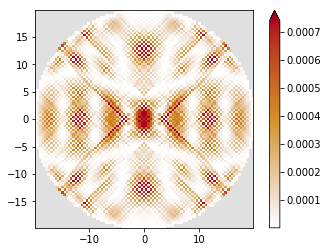

energy eigenstate: 189
eigenvalue: 0.106622878731


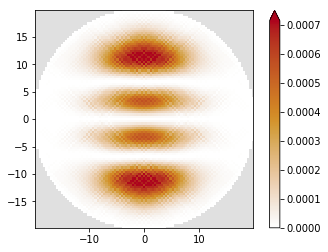

energy eigenstate: 193
eigenvalue: 0.112054792638


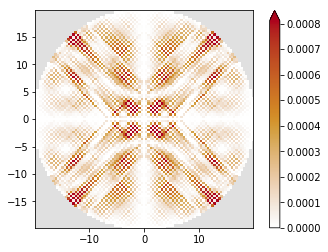

energy eigenstate: 199
eigenvalue: 0.118026427645


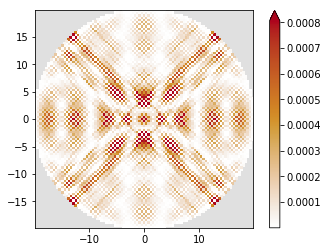

energy eigenstate: 216
eigenvalue: -0.129752188063


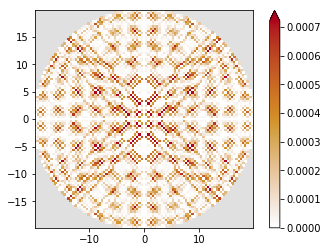

energy eigenstate: 225
eigenvalue: -0.136704675222


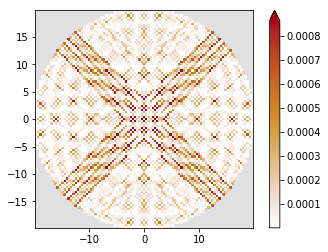

energy eigenstate: 231
eigenvalue: 0.141425131198


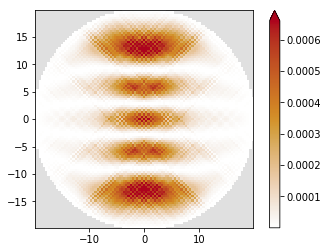

energy eigenstate: 236
eigenvalue: -0.146408889781


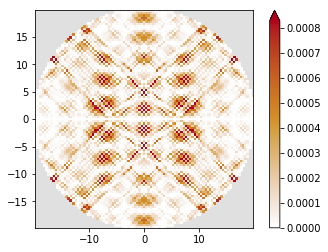

energy eigenstate: 239
eigenvalue: -0.148526478196


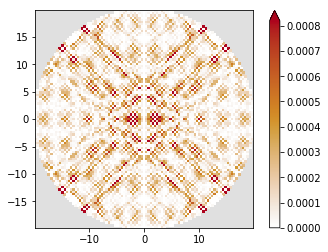

energy eigenstate: 240
eigenvalue: -0.150038330931


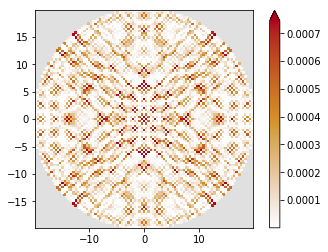

energy eigenstate: 245
eigenvalue: 0.152053414635


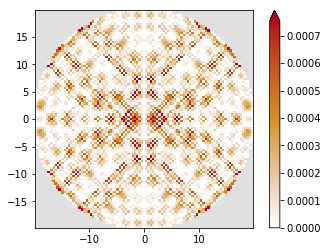

energy eigenstate: 248
eigenvalue: 0.15538349215


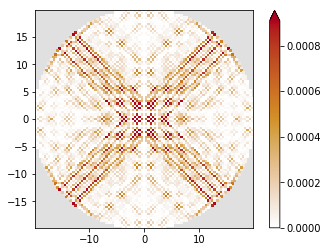

energy eigenstate: 249
eigenvalue: 0.155761031459


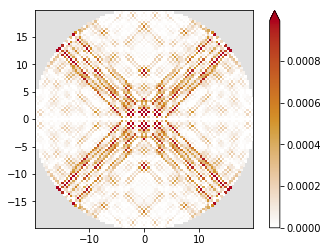

energy eigenstate: 250
eigenvalue: 0.156899849637


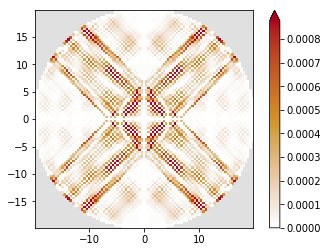

energy eigenstate: 251
eigenvalue: -0.15834594508


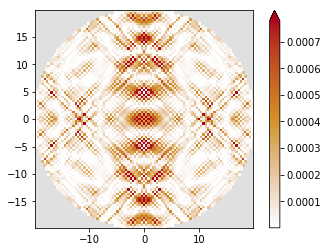

energy eigenstate: 252
eigenvalue: -0.15846748902


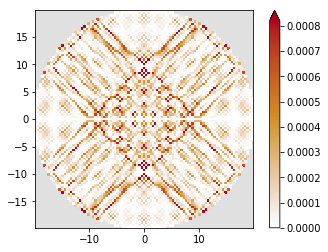

energy eigenstate: 254
eigenvalue: -0.160312784185


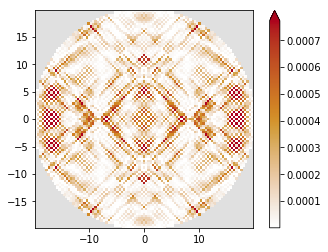

energy eigenstate: 256
eigenvalue: -0.161593897889


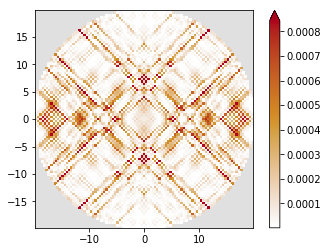

energy eigenstate: 257
eigenvalue: -0.162121465566


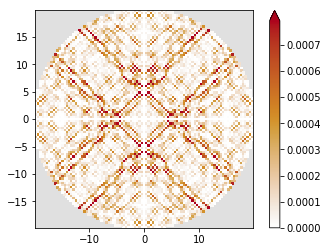

energy eigenstate: 259
eigenvalue: -0.163228284752


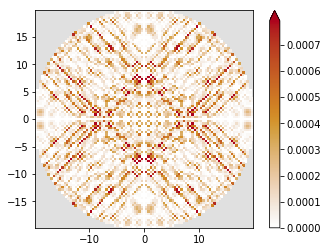

energy eigenstate: 262
eigenvalue: 0.163116534599


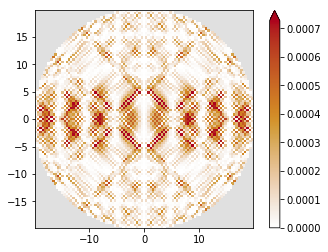

energy eigenstate: 263
eigenvalue: -0.167595578051


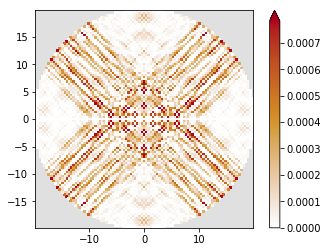

energy eigenstate: 272
eigenvalue: -0.17282534929


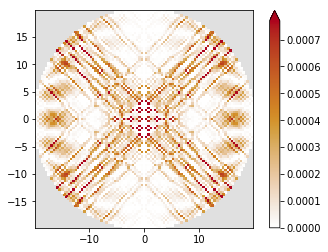

energy eigenstate: 276
eigenvalue: -0.173751053949


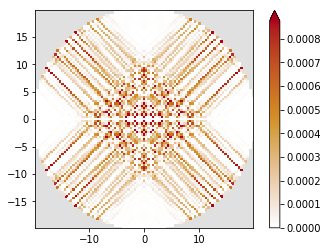

energy eigenstate: 277
eigenvalue: -0.175057330095


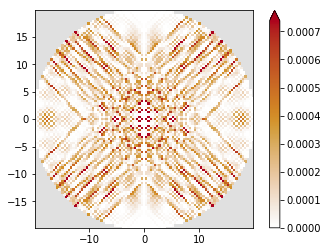

energy eigenstate: 282
eigenvalue: -0.178070395204


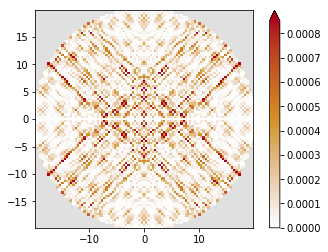

energy eigenstate: 284
eigenvalue: -0.178992080321


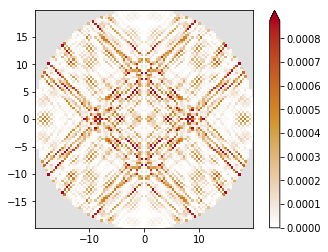

energy eigenstate: 287
eigenvalue: 0.179667063015


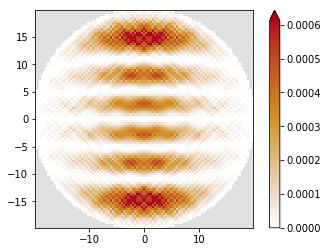

energy eigenstate: 289
eigenvalue: -0.184194228611


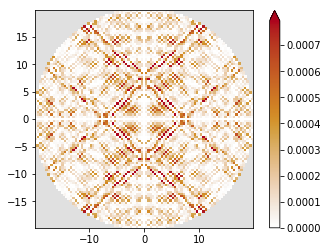

energy eigenstate: 294
eigenvalue: 0.18513175317


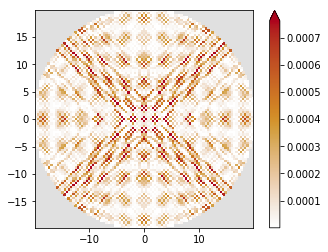

energy eigenstate: 297
eigenvalue: -0.193764958295


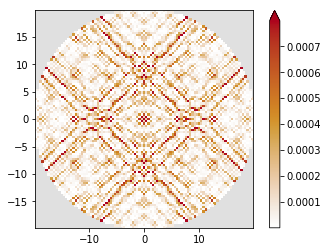

energy eigenstate: 300
eigenvalue: 0.191036986041


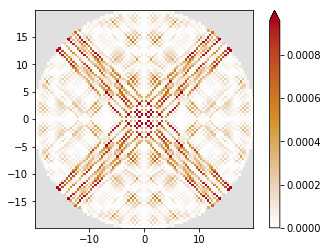

energy eigenstate: 301
eigenvalue: -0.195839057864


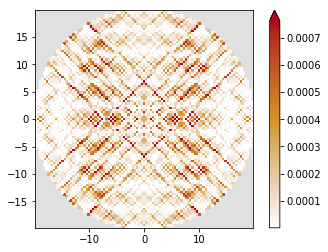

energy eigenstate: 303
eigenvalue: -0.197240534061


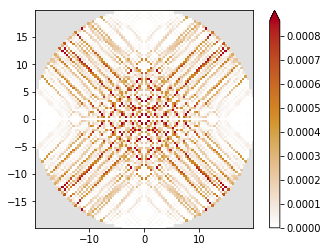

energy eigenstate: 304
eigenvalue: -0.197902244418


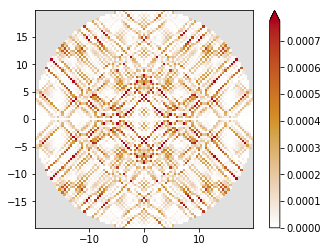

energy eigenstate: 305
eigenvalue: -0.197906014009


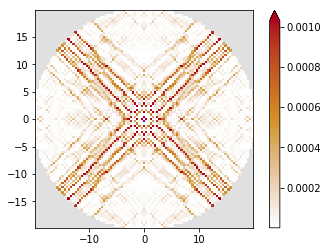

energy eigenstate: 306
eigenvalue: -0.19881784564


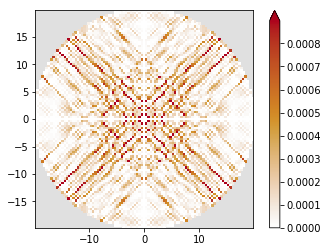

energy eigenstate: 314
eigenvalue: -0.207812497504


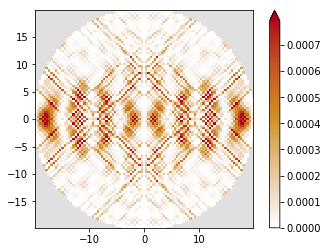

energy eigenstate: 320
eigenvalue: -0.212596851538


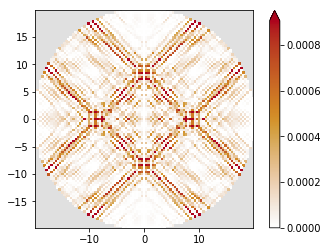

energy eigenstate: 330
eigenvalue: -0.217284280365


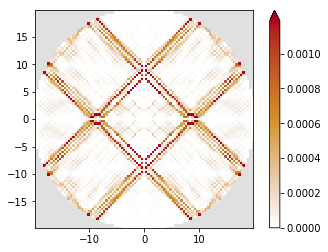

energy eigenstate: 331
eigenvalue: -0.218628435928


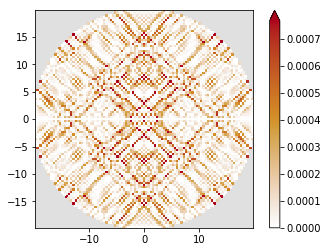

energy eigenstate: 332
eigenvalue: -0.21867465131


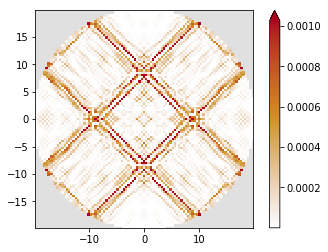

energy eigenstate: 333
eigenvalue: -0.219557060709


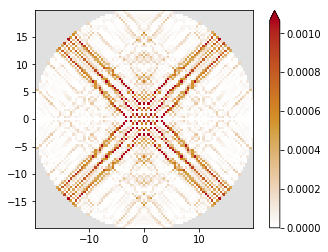

energy eigenstate: 335
eigenvalue: -0.220248607151


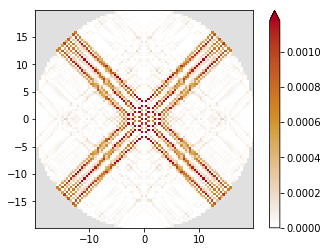

energy eigenstate: 347
eigenvalue: 0.21488134749


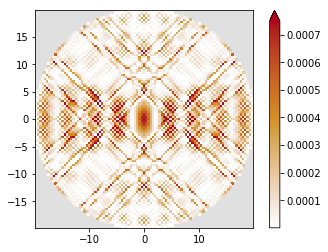

energy eigenstate: 349
eigenvalue: 0.216303934961


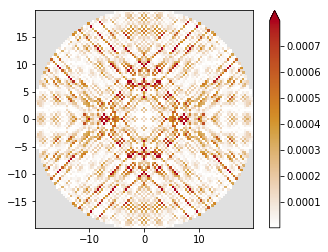

energy eigenstate: 351
eigenvalue: 0.21706666062


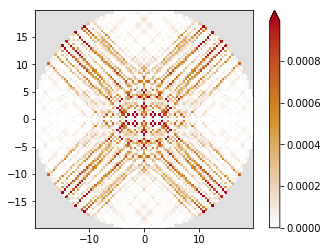

energy eigenstate: 353
eigenvalue: -0.229849495292


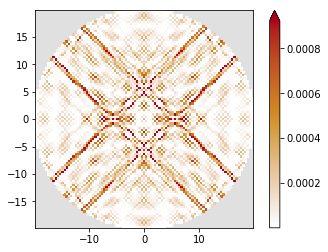

energy eigenstate: 354
eigenvalue: -0.230903014908


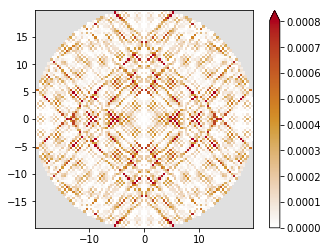

energy eigenstate: 355
eigenvalue: -0.231383354257


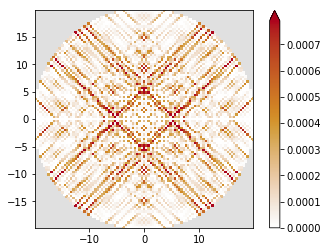

energy eigenstate: 356
eigenvalue: 0.219814330269


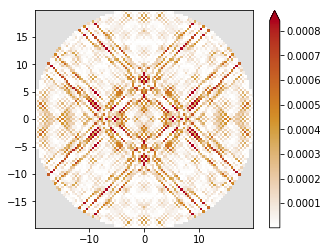

energy eigenstate: 357
eigenvalue: -0.232825096528


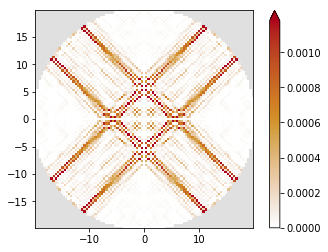

energy eigenstate: 359
eigenvalue: -0.234213332644


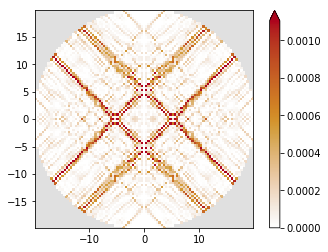

energy eigenstate: 360
eigenvalue: 0.222483873082


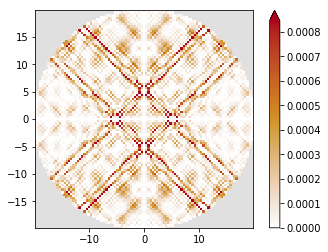

energy eigenstate: 364
eigenvalue: -0.235271856916


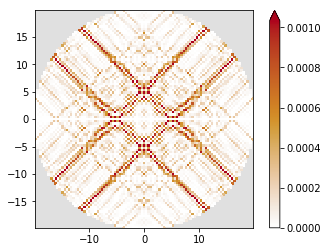

energy eigenstate: 365
eigenvalue: -0.236464393935


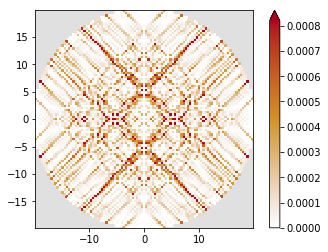

energy eigenstate: 366
eigenvalue: -0.236833190809


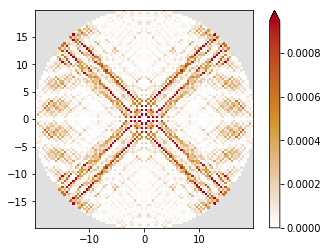

energy eigenstate: 367
eigenvalue: -0.236851906309


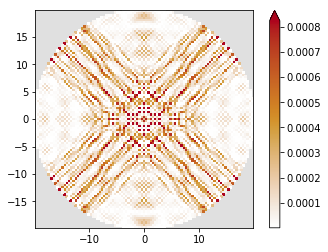

energy eigenstate: 368
eigenvalue: -0.237598385649


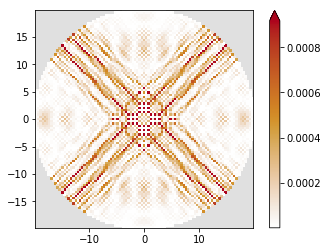

energy eigenstate: 370
eigenvalue: -0.239580506547


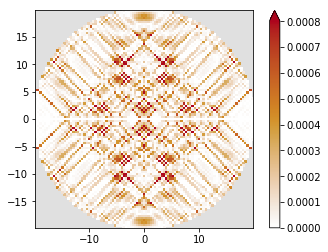

energy eigenstate: 371
eigenvalue: -0.239510776428


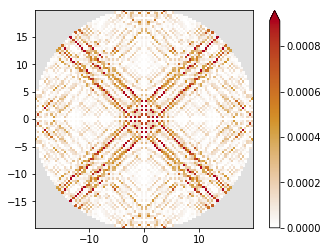

energy eigenstate: 374
eigenvalue: 0.226833830141


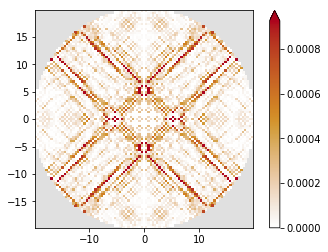

energy eigenstate: 375
eigenvalue: 0.228376581479


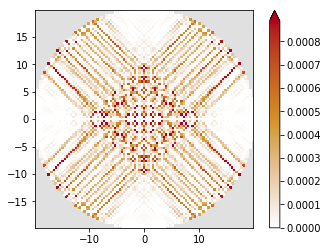

energy eigenstate: 377
eigenvalue: 0.229864726057


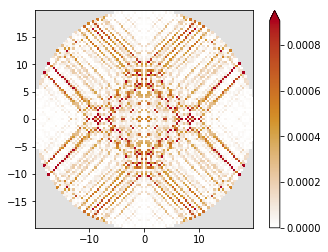

energy eigenstate: 378
eigenvalue: 0.230226667256


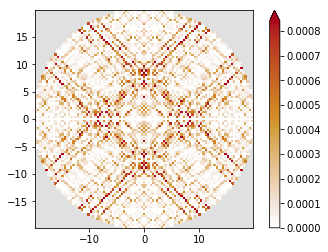

energy eigenstate: 381
eigenvalue: -0.247816342866


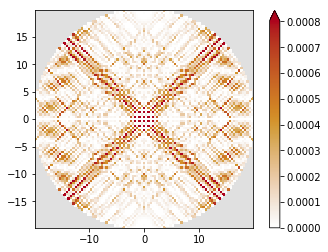

energy eigenstate: 382
eigenvalue: -0.249004123336


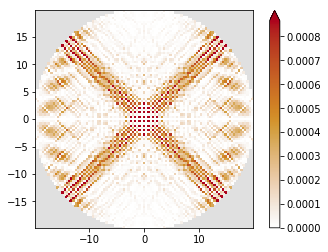

energy eigenstate: 383
eigenvalue: -0.248130245214


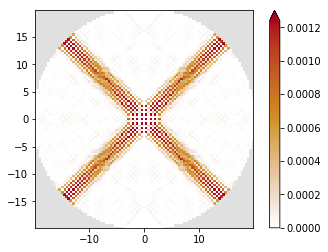

energy eigenstate: 384
eigenvalue: -0.248116769811


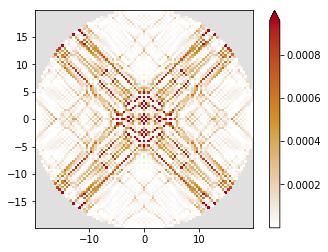

energy eigenstate: 389
eigenvalue: 0.235940476421


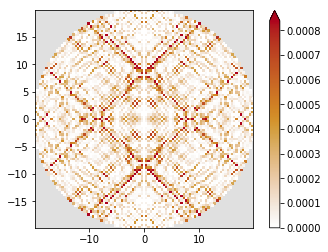

energy eigenstate: 401
eigenvalue: 0.242981936983


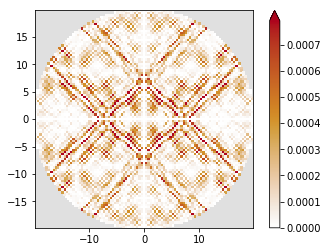

energy eigenstate: 402
eigenvalue: 0.244395463912


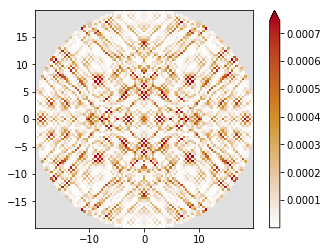

energy eigenstate: 405
eigenvalue: 0.248240476291


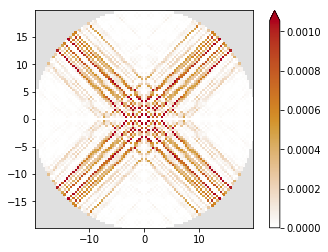

energy eigenstate: 406
eigenvalue: 0.248459064604


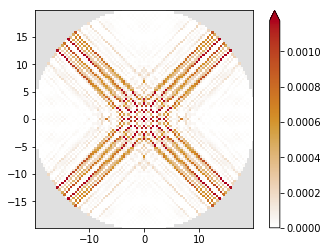

energy eigenstate: 407
eigenvalue: 0.248792515142


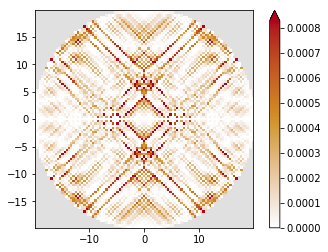

energy eigenstate: 410
eigenvalue: 0.250722510355


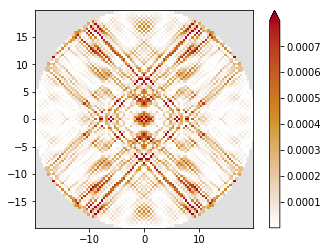

energy eigenstate: 414
eigenvalue: 0.254548051206


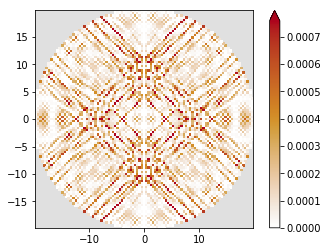

energy eigenstate: 416
eigenvalue: -0.274097900626


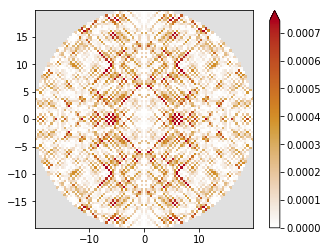

energy eigenstate: 421
eigenvalue: -0.280158934777


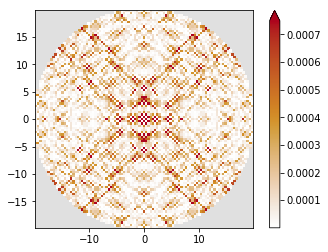

energy eigenstate: 425
eigenvalue: -0.283603193006


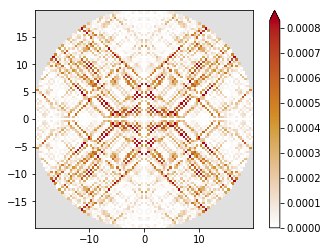

energy eigenstate: 429
eigenvalue: -0.287650767823


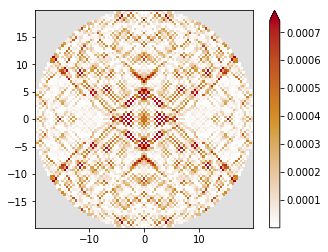

energy eigenstate: 432
eigenvalue: -0.290457597931


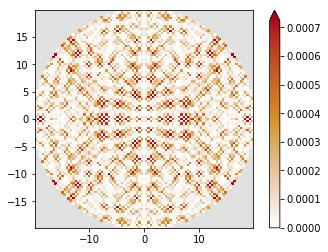

energy eigenstate: 434
eigenvalue: -0.292286583837


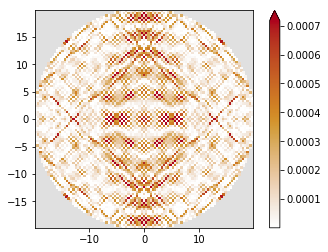

energy eigenstate: 436
eigenvalue: 0.265566511323


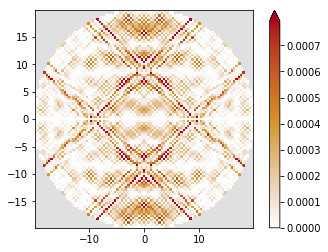

energy eigenstate: 437
eigenvalue: -0.294738906681


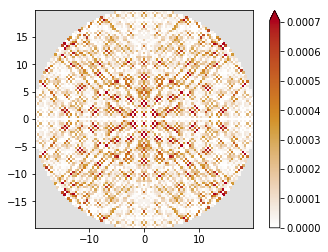

energy eigenstate: 441
eigenvalue: 0.269500798894


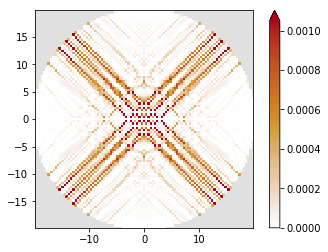

energy eigenstate: 442
eigenvalue: 0.269587118325


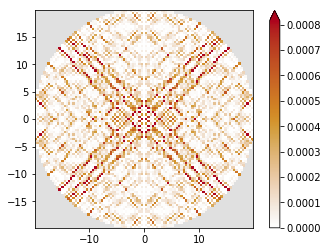

energy eigenstate: 443
eigenvalue: 0.270598793433


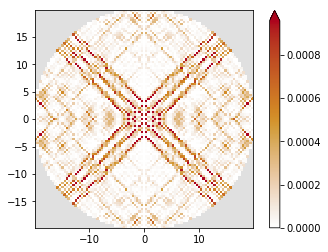

energy eigenstate: 455
eigenvalue: -0.308198092891


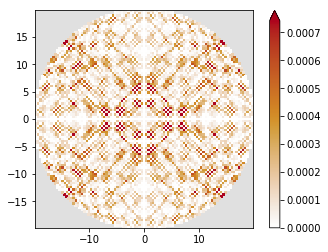

energy eigenstate: 457
eigenvalue: -0.30943076242


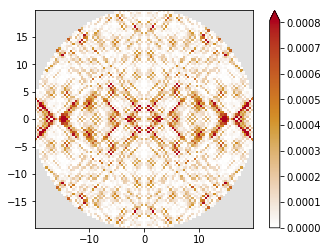

energy eigenstate: 460
eigenvalue: 0.281330761603


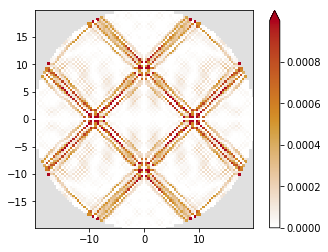

energy eigenstate: 461
eigenvalue: 0.281681062768


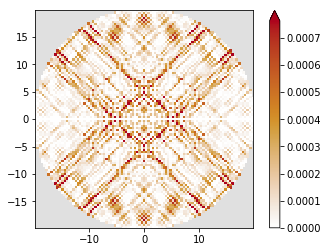

energy eigenstate: 464
eigenvalue: 0.284568930821


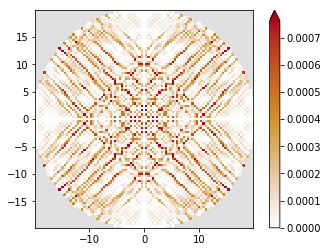

energy eigenstate: 467
eigenvalue: 0.285763595786


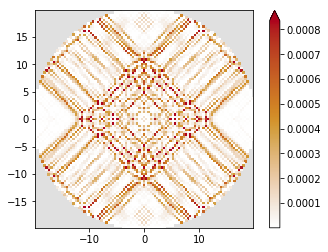

energy eigenstate: 469
eigenvalue: 0.286343884721


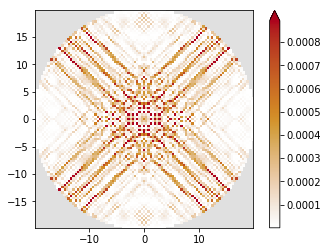

energy eigenstate: 470
eigenvalue: 0.287120677321


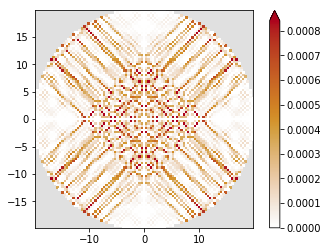

energy eigenstate: 471
eigenvalue: 0.287513510167


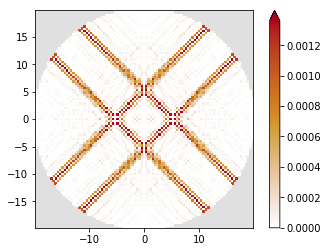

energy eigenstate: 472
eigenvalue: 0.288308039876


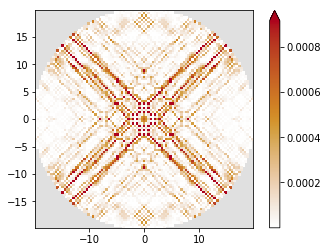

energy eigenstate: 473
eigenvalue: 0.290128279005


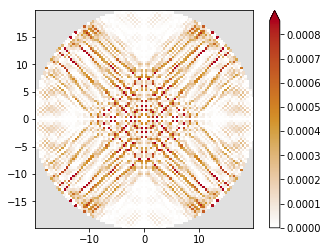

energy eigenstate: 474
eigenvalue: 0.290469294355


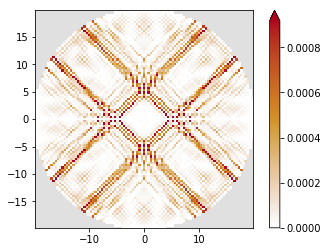

energy eigenstate: 476
eigenvalue: -0.317445711855


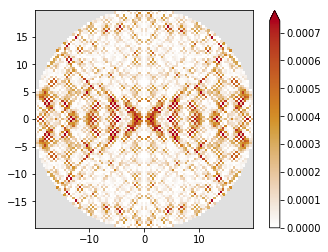

energy eigenstate: 478
eigenvalue: 0.294681709857


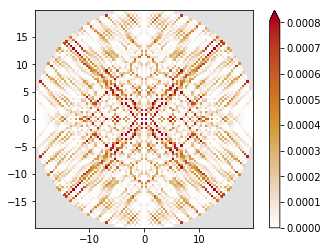

energy eigenstate: 481
eigenvalue: 0.296975334446


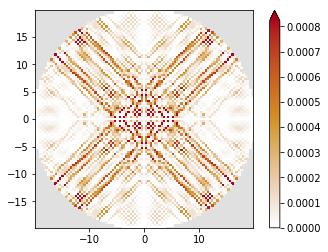

energy eigenstate: 482
eigenvalue: 0.298049782403


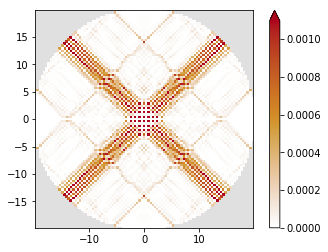

energy eigenstate: 483
eigenvalue: 0.298357871648


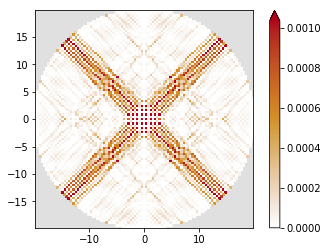

energy eigenstate: 487
eigenvalue: 0.301070465014


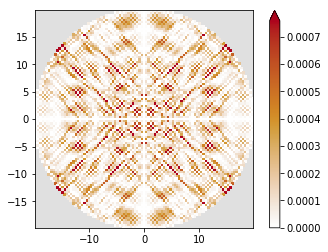

energy eigenstate: 491
eigenvalue: 0.305516651937


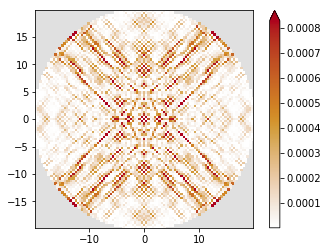

energy eigenstate: 496
eigenvalue: -0.328419349333


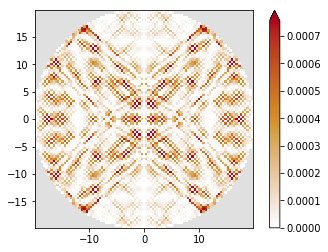

energy eigenstate: 501
eigenvalue: 0.314847357076


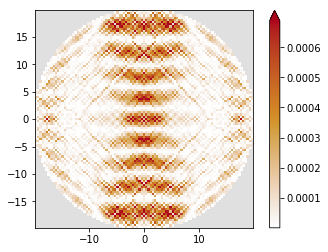

energy eigenstate: 509
eigenvalue: -0.342123551279


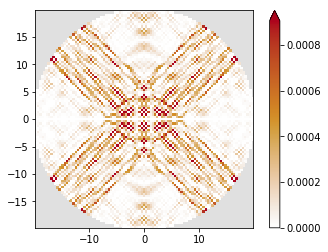

energy eigenstate: 525
eigenvalue: 0.337678409432


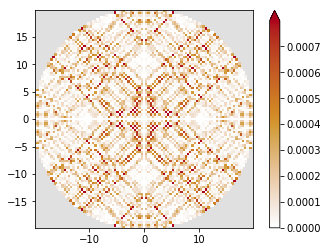

energy eigenstate: 528
eigenvalue: 0.340331860511


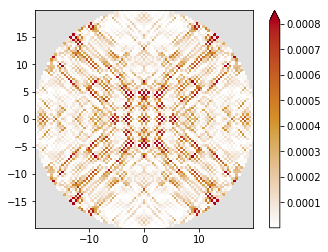

energy eigenstate: 532
eigenvalue: -0.365689475672


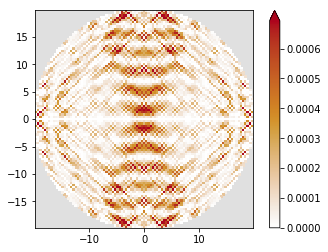

energy eigenstate: 535
eigenvalue: 0.347443997471


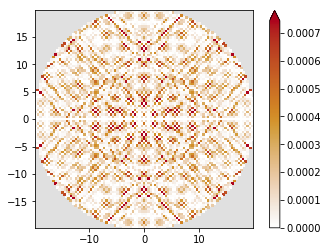

energy eigenstate: 536
eigenvalue: -0.368973527728


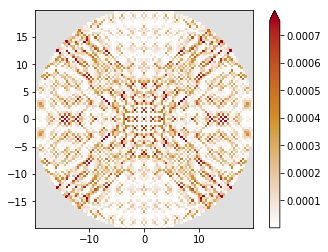

energy eigenstate: 537
eigenvalue: -0.371676708722


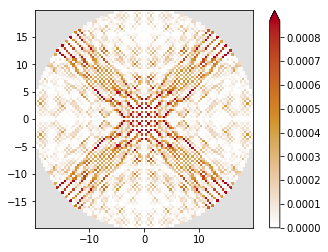

energy eigenstate: 538
eigenvalue: 0.350520555237


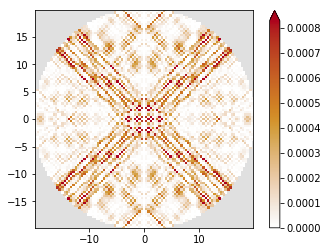

energy eigenstate: 540
eigenvalue: -0.373273571663


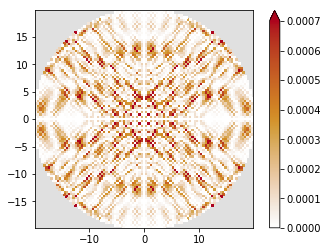

energy eigenstate: 549
eigenvalue: 0.358171286203


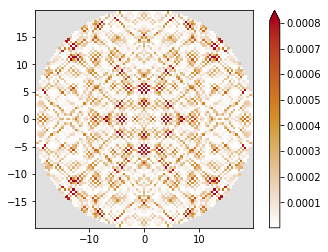

energy eigenstate: 550
eigenvalue: -0.380444503812


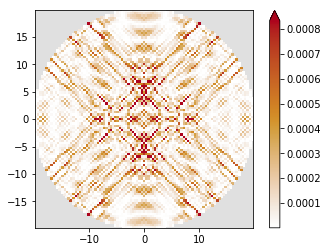

energy eigenstate: 551
eigenvalue: -0.380739139394


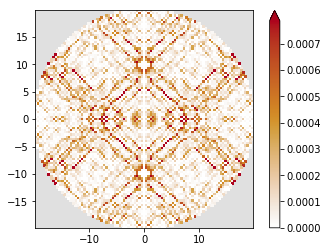

energy eigenstate: 555
eigenvalue: -0.384180801603


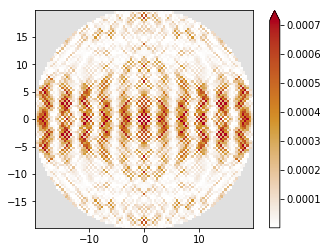

energy eigenstate: 559
eigenvalue: -0.389680858561


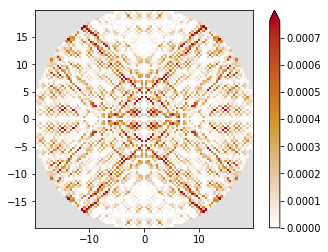

energy eigenstate: 560
eigenvalue: -0.391640217768


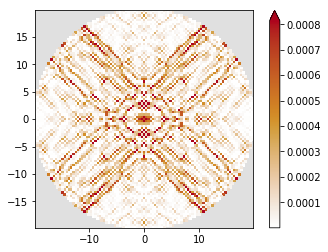

energy eigenstate: 566
eigenvalue: 0.372166656126


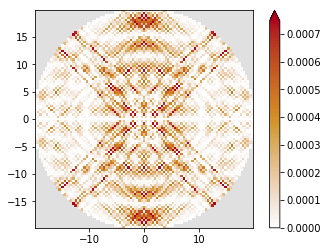

energy eigenstate: 572
eigenvalue: 0.381368158478


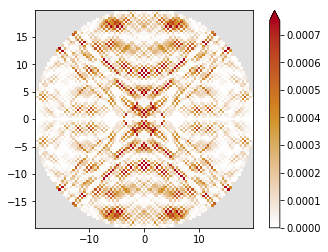

energy eigenstate: 579
eigenvalue: -0.406168651935


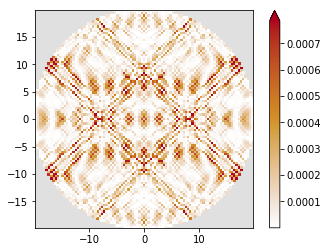

energy eigenstate: 584
eigenvalue: 0.392506569256


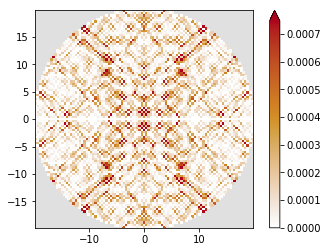

energy eigenstate: 590
eigenvalue: 0.39976355289


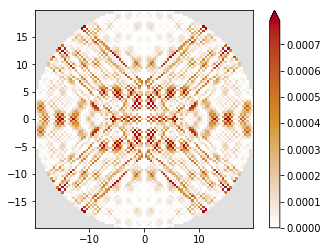

In [64]:
res_idx = get_candidates_idx(syst=syst,tresh=0.2, dist=8., overlap_def=0.)
svals = get_candidates_vals(res_idx, eigenvalues, eigenvectors)

energy eigenstate: 4
eigenvalue: 0.00694675500823


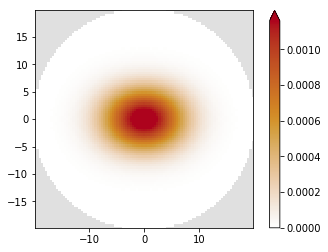

energy eigenstate: 9
eigenvalue: -0.0125312631849


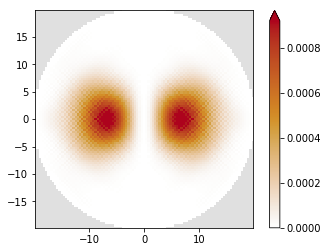

energy eigenstate: 25
eigenvalue: -0.0335395897611


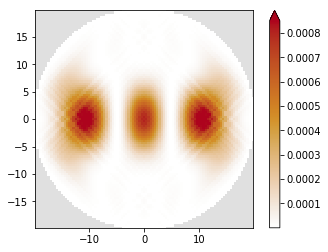

energy eigenstate: 155
eigenvalue: 0.0730498341699


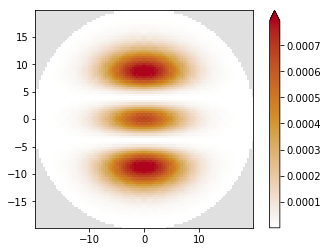

[(-0.033539589761055685, 25), (-0.012531263184854086, 9), (0.0069467550082311395, 4), (0.073049834169929398, 155)]


In [65]:
numeric_res_idx = [4,9,25,155]
numeric_energies = get_candidates_vals(numeric_res_idx, eigenvalues, eigenvectors)
print(numeric_energies)

In [66]:
chosen_theor_energies = [c for c in Enmlist if c[1]==(0,0) or c[1]==(1,0) or c[1]==(2,0) or c[1]==(0,2)]
chosen_theor_energies

[(0.0098759053278638063, (0, 0)),
 (0.10334247689224718, (0, 2)),
 (-0.017105569798600274, (1, 0)),
 (-0.044087044925064364, (2, 0))]

In [67]:
mapping_matrix = [(155,(0,2)),(25,(2,0)),(9,(1,0)),(4,(0,0))]
mapping_matrix

[(155, (0, 2)), (25, (2, 0)), (9, (1, 0)), (4, (0, 0))]

In [68]:
for i in mapping_matrix:
    numeric_idx = i[0]
    theor_idx = i[1]
    numeric_res = [x[0] for x in numeric_energies if x[1]==numeric_idx][0]
    theor_res = [x[0] for x in chosen_theor_energies if x[1]==theor_idx][0]
    # in this example numeric_res<theor_res
    print(theor_idx, round(numeric_res*100/theor_res,2),'%',theor_res,numeric_res)

(0, 2) 70.69 % 0.103342476892 0.0730498341699
(2, 0) 76.08 % -0.0440870449251 -0.0335395897611
(1, 0) 73.26 % -0.0171055697986 -0.0125312631849
(0, 0) 70.34 % 0.00987590532786 0.00694675500823


## Comparison of theoretical modeling and numerical calculations using Kwant for second set of parameters

In [69]:
## second set parameters to calculate eigenenergies
A = 0.00129
B = 0.0002
C = 0.0018

#
x_pot = np.arange(-20,20,0.01)
y_pot = np.arange(-20,20,0.01)

#
R = 30
a = R / 70  

# theoretical 1 parameters
N_n = 60 # number of n eigenstates
N_m = 60 # number of m eigenstates

#
k=500

In [70]:
def saddle_potential(x, y, A_pot=A, B_pot=B, C_pot=C):
     return (1./2.)*(-1.*A_pot*x*x + B_pot*y*x + C_pot*y*y) 

In [71]:
def get_potential(x=x_pot, y=y_pot, func=saddle_potential):
    # creating potential
    X, Y = np.meshgrid(x, y)
    Z = saddle_potential(X, Y, A, B, C)
    return (X,Y,Z)

In [72]:
pot_syst = get_potential()

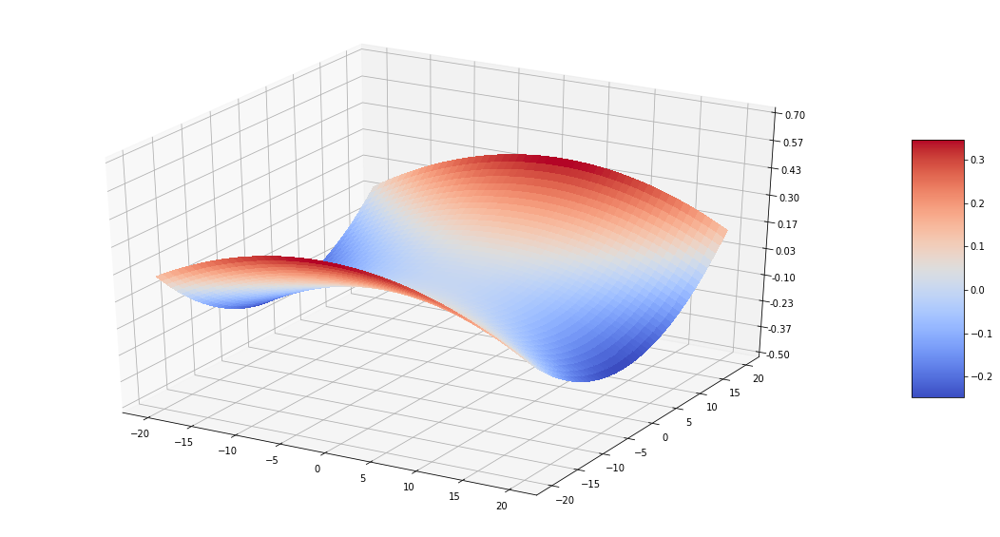

In [73]:
plot_potential(X=pot_syst[0], Y=pot_syst[1], Z=pot_syst[2], z_lim_start=-0.5, z_lim_end=0.7)

In [74]:
discretized_ham = discretize_hamiltonian(a=a, ham=base_hamiltonian)

# Discrete coordinates: x y

# Onsite element:
def onsite(site, V):
    (x, y, ) = site.pos
    _const_0 = (V(x, y))
    return (_const_0)

# Hopping from (1, 0):
(2.7222222222222214+0j)

# Hopping from (0, 1):
(-2.7222222222222214+0j)


In [75]:
syst = create_system(template=discretized_ham, stadium=stadium)

In [76]:
eigenvalues, eigenvectors = calculate_eigenvecs_eigenvals_e0(syst=syst, potential=saddle_potential, k_num=k) 

15361
(15361, 500)


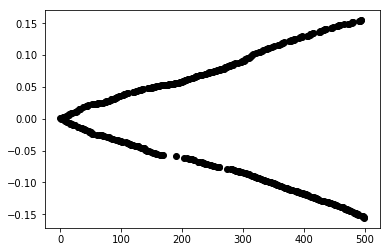

In [77]:
plot_eigenvalues(eigenvalues)

In [78]:
Enmlist = get_theoretical_eigenenergies(A=A, B=B, C=C, N_n=N_n, N_m=N_m)

[7, 20, 31, 44, 56, 57, 74, 105, 125, 133, 156, 162, 164, 167, 169, 171, 173, 236, 241, 247, 287, 313, 315, 324, 342, 352, 353, 404, 410, 420, 425, 430, 463, 469, 474, 497]
energy eigenstate: 7
eigenvalue: 0.00298966673121


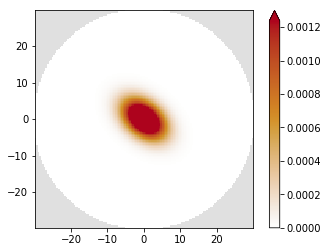

energy eigenstate: 20
eigenvalue: -0.00838683290179


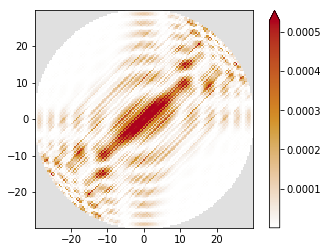

energy eigenstate: 31
eigenvalue: 0.014924755748


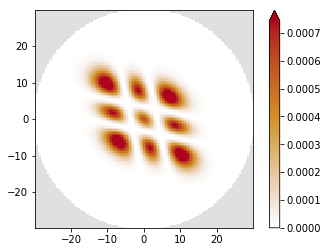

energy eigenstate: 44
eigenvalue: 0.0195966509986


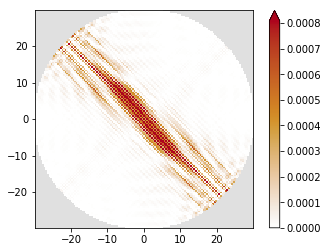

energy eigenstate: 56
eigenvalue: 0.0231454373784


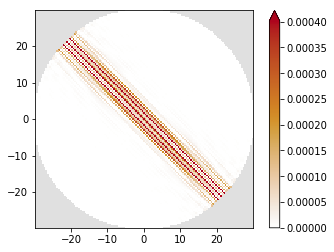

energy eigenstate: 57
eigenvalue: 0.0233109393243


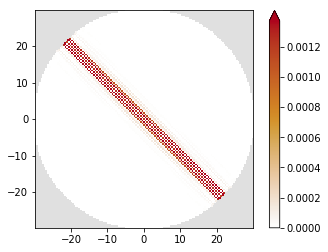

energy eigenstate: 74
eigenvalue: 0.0267828795845


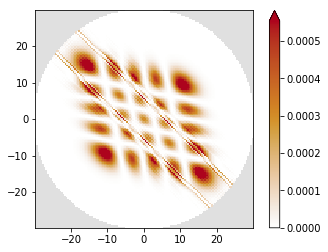

energy eigenstate: 105
eigenvalue: 0.0383249942587


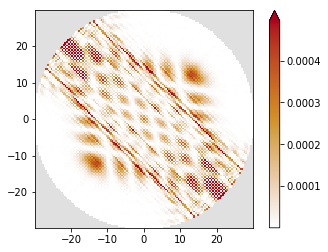

energy eigenstate: 125
eigenvalue: 0.0431015510901


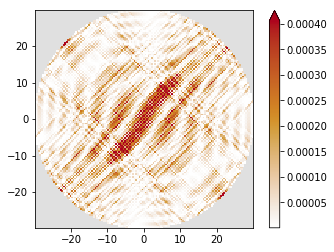

energy eigenstate: 133
eigenvalue: -0.0452518993589


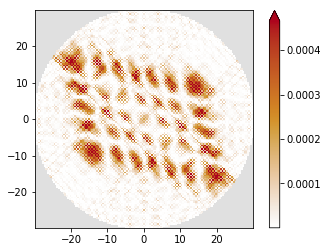

energy eigenstate: 156
eigenvalue: 0.0506282984098


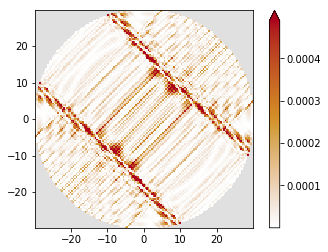

energy eigenstate: 162
eigenvalue: 0.0519504577153


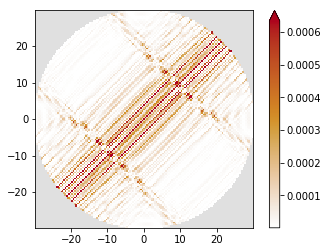

energy eigenstate: 164
eigenvalue: -0.056282039239


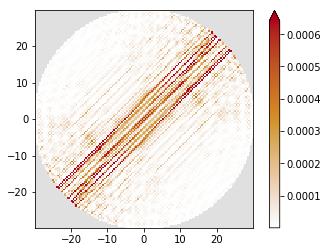

energy eigenstate: 167
eigenvalue: -0.0572533943632


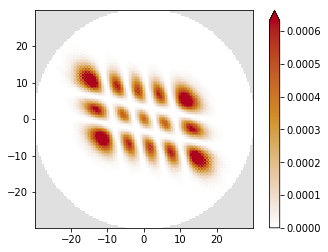

energy eigenstate: 169
eigenvalue: 0.0527452743453


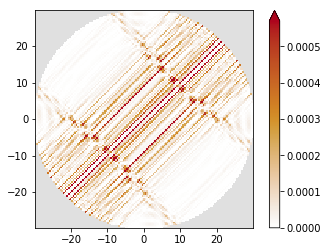

energy eigenstate: 171
eigenvalue: 0.0531593160819


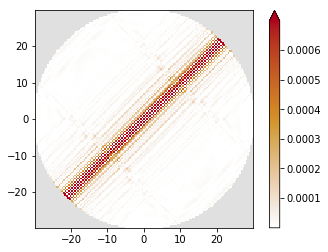

energy eigenstate: 173
eigenvalue: 0.0532634766572


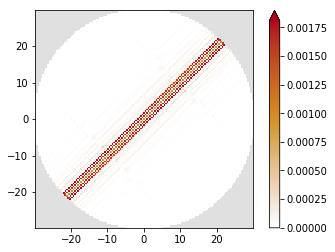

energy eigenstate: 236
eigenvalue: -0.0693117798821


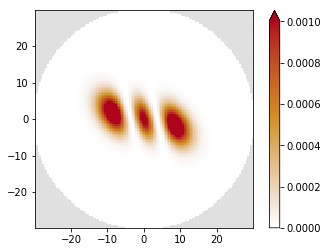

energy eigenstate: 241
eigenvalue: -0.0710539359719


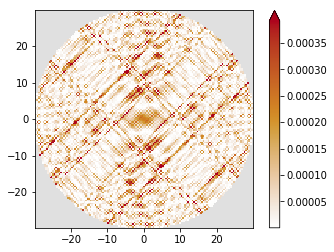

energy eigenstate: 247
eigenvalue: -0.0731529351703


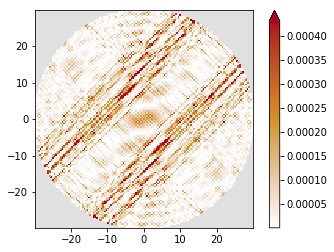

energy eigenstate: 287
eigenvalue: 0.0872260633349


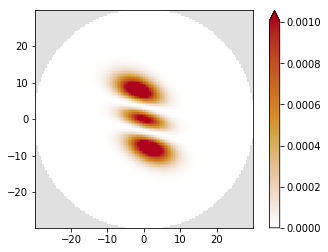

energy eigenstate: 313
eigenvalue: 0.0989764995167


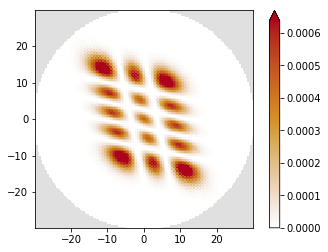

energy eigenstate: 315
eigenvalue: 0.100703018708


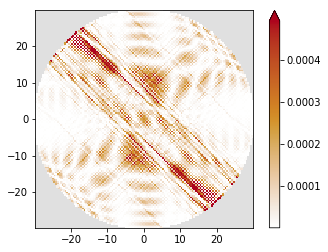

energy eigenstate: 324
eigenvalue: -0.0925657584544


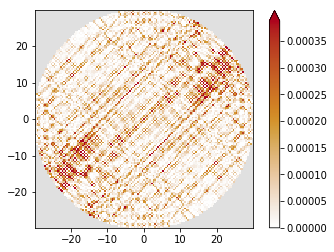

energy eigenstate: 342
eigenvalue: 0.111387736448


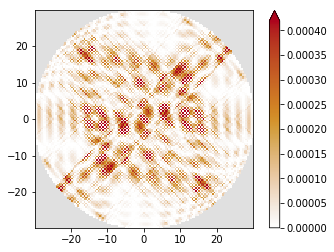

energy eigenstate: 352
eigenvalue: -0.102238339545


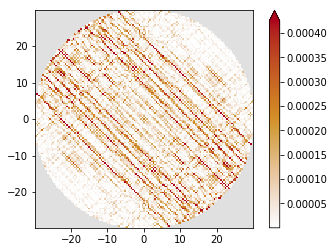

energy eigenstate: 353
eigenvalue: -0.102471123571


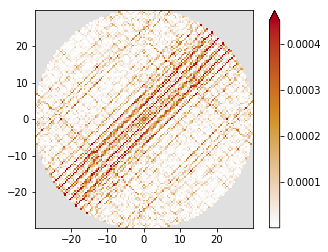

energy eigenstate: 404
eigenvalue: -0.119321386403


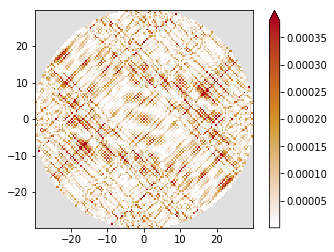

energy eigenstate: 410
eigenvalue: 0.132786295094


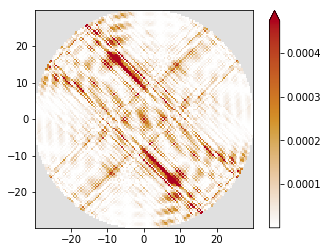

energy eigenstate: 420
eigenvalue: -0.124999121858


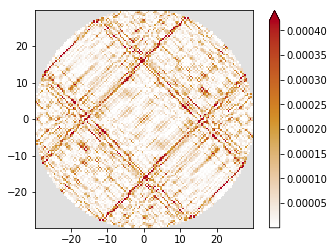

energy eigenstate: 425
eigenvalue: -0.127214010748


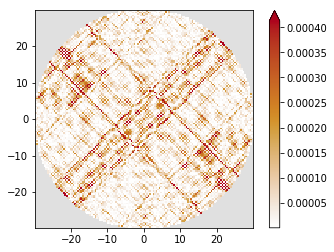

energy eigenstate: 430
eigenvalue: -0.12917558944


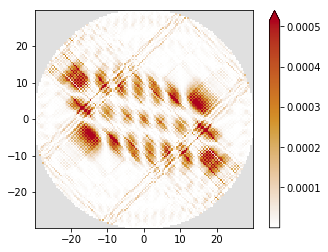

energy eigenstate: 463
eigenvalue: -0.139128837937


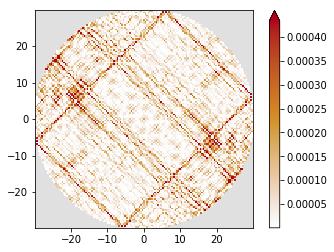

energy eigenstate: 469
eigenvalue: -0.141482612808


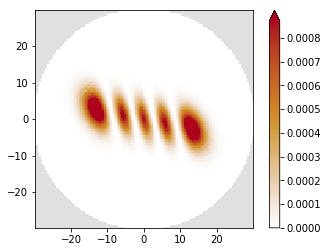

energy eigenstate: 474
eigenvalue: -0.143718600028


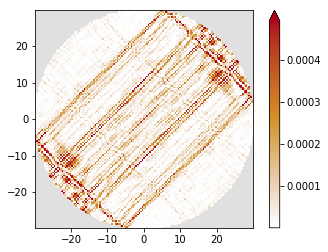

energy eigenstate: 497
eigenvalue: -0.153864935356


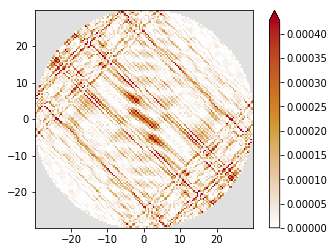

In [79]:
res_idx = get_candidates_idx(syst=syst,tresh=0.0002, dist=0.3, overlap_def=0.)
svals = get_candidates_vals(res_idx, eigenvalues, eigenvectors)

energy eigenstate: 7
eigenvalue: 0.00298966673121


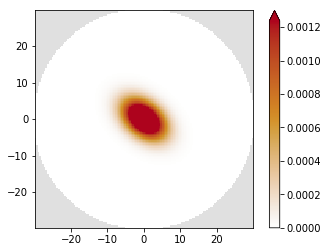

energy eigenstate: 19
eigenvalue: 0.00896312845277


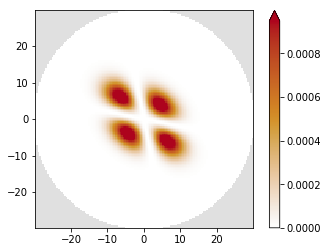

energy eigenstate: 31
eigenvalue: 0.014924755748


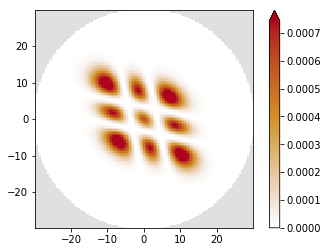

energy eigenstate: 46
eigenvalue: 0.0208723444553


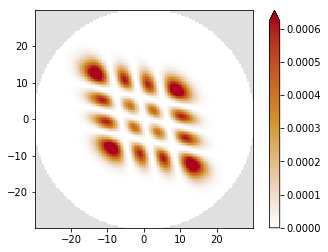

[(0.0029896667312060417, 7), (0.0089631284527715224, 19), (0.01492475574798992, 31), (0.020872344455281272, 46)]


In [80]:
numeric_res_idx = [7,19,31,46]
numeric_energies = get_candidates_vals(numeric_res_idx, eigenvalues, eigenvectors)
print(numeric_energies)

In [81]:
chosen_theor_energies = [c for c in Enmlist if c[1]==(0,0) or c[1]==(1,1) or c[1]==(2,2) or c[1]==(3,3)]
chosen_theor_energies

[(0.0028495690419693062, (0, 0)),
 (0.0085487071259079256, (1, 1)),
 (0.014247845209846538, (2, 2)),
 (0.019946983293785137, (3, 3))]

In [82]:
mapping_matrix = [(7,(0,0)),(19,(1,1)),(31,(2,2)),(46,(3,3))]
mapping_matrix

[(7, (0, 0)), (19, (1, 1)), (31, (2, 2)), (46, (3, 3))]

In [83]:
for i in mapping_matrix:
    numeric_idx = i[0]
    theor_idx = i[1]
    numeric_res = [x[0] for x in numeric_energies if x[1]==numeric_idx][0]
    theor_res = [x[0] for x in chosen_theor_energies if x[1]==theor_idx][0]
    # in this example theor_res<numeric_res
    print(theor_idx, round(theor_res*100/numeric_res,2),'%',theor_res,numeric_res)

(0, 0) 95.31 % 0.00284956904197 0.00298966673121
(1, 1) 95.38 % 0.00854870712591 0.00896312845277
(2, 2) 95.46 % 0.0142478452098 0.014924755748
(3, 3) 95.57 % 0.0199469832938 0.0208723444553
